# Reinforcement Agent Trading Gold and Bitcoin, using Tweets and Bitcoin News Headlines

OBS!
This notebook was developed and executed in cloud environments. It has thus been designed and run on Linux environments, and although this notebook here has been modified to function locally, we cannot guarantee that it will run in Mac/Windows environments. The link below is to a Google Colab notebook where we have tested and ensured that everything runs. Apart from a few extra cells in the Google Colab notebook, it is a 1-to-1 exact copy of this notebook here, which we have compiled for the submission.

We recommend that you run any code that you wish to run through this link! 
https://colab.research.google.com/drive/1gljNliqq8S2zi3eN-CTl8iDUMlrpN7Zy?usp=sharing

By:


*   Dimitris Zerzis - s210911
*   Eben Apeni - s216084
*   Ilias Kappos - s212872
*   Jakob Ryttergaard Poulsen - s213470



Below is the table of contributions. Note that every group member contributed to all sections whether by coding, writing or participating in discussions, but the table below shows the main responsible group members for each section.

|  Section | Main responsible  |   |   |   |
|---|---|---|---|---|
| Financial Indicators  | Ilias  |   |   |   |
| Twitter Sentiment/LDA  | Jakob  |   |   |   |
| Bitcoin News Headlines |  Eben |   |   |   |
| Reinforcement Learning | Ilias/Dimitris  |   |   |   |
| SHAP | Jakob  |   |   |   |

# Notebook Setup - Run this first!

The setup section here will install and load necessary libraries. It will also download and load models, dataframes and specific variables, such that any section in this notebook may be run independently of any other section having been run. The notebook may still be followed sequentially, from top to bottom, and while it is possible, it is not recommended to try to execute every block of code, due to the heavy amounts of data processing and model-training that this project has entailed.

In [ ]:
#Install libraries
!pip install yfinance
!pip install stable_baselines
!pip install tensorflow-gpu==1.15.3 
!pip install empyrical
!pip install shap

In [ ]:
#Essential imports
import pickle
import shutil
import importlib
import os
import pandas as pd
import numpy as np
import requests
import matplotlib.pyplot as plt
import yfinance as yf
import datetime
import gym
from stable_baselines.common.base_class import BaseRLModel
from stable_baselines.common.policies import MlpLnLstmPolicy
from stable_baselines.common.vec_env import DummyVecEnv, SubprocVecEnv
from stable_baselines import PPO2
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import warnings
from pprint import pprint
warnings.filterwarnings('ignore')

In [ ]:
#shutil.rmtree("ABA")
#shutil.rmtree("news_lda_model")

In [ ]:
#Clone files from repo

!git clone https://github.com/Maqerfoo/ABAstonks.git
!rm -rf ABAstonks/.git
!rm ABAstonks/Main.ipynb

Cloning into 'ABAstonks'...
^C
rm: cannot remove 'ABAstonks/Main.ipynb': No such file or directory


In [ ]:
#Restructure files, such that this notebook is Main.ipynb
allfiles = os.listdir("ABAstonks")
for f in allfiles:
    shutil.move(os.path.join("ABAstonks", f), f)
os.rmdir("ABAstonks")

FileNotFoundError: ignored

In [ ]:
#setup
np.warnings.filterwarnings('ignore')
plt.rcParams["figure.figsize"] = [16,9]

In [ ]:
#Read final dataframe
path = "final_df_all.csv"
if os.path.isfile(path):
  data = pd.read_csv("final_df_all.csv")
  data = data.set_index("Date")
  data.index = pd.to_datetime(data.index)

In [ ]:
#For loading the best model
path_model = "ppo2_agents/agents_PPΟ2_"

reward_strategy = "sortino"
curr_idx = 39

In [ ]:
import ABA.Environments.Render.Render_Graph
import ABA.Environments.TradingEnvironment___
importlib.reload(ABA.Environments.Render.Render_Graph)
importlib.reload(ABA.Environments.TradingEnvironment___)
from ABA.Environments.Render.Render_Graph import BitcoinTradingGraph
from ABA.Environments.TradingEnvironment___ import TradingEnvironment

In [ ]:
##Split my dataset into train and test set (test 20% of the original dataset)
test_length = int(len(data) * 0.2)
train_length = int(len(data)) - test_length

train_data = data[:train_length]
test_data=data[train_length:]

# Creating three environments, one for the training and one for the test dataset 
train_env = DummyVecEnv([lambda: TradingEnvironment(data=train_data, initial_balance=10000, commission=0.0025, reward_function='sortino', forecast_length=10, confidence_interval=0.95)])
test_env = DummyVecEnv([lambda: TradingEnvironment(data=test_data, initial_balance=10000, commission=0.0025, reward_function='sortino', forecast_length=10, confidence_interval=0.95)])

In [ ]:
#Load calculated shap values
import shap

with open("shap", "rb") as f:
    shap_values = pickle.load(f)
#Load statelog
path = path_model + reward_strategy + "_" + str(curr_idx) + "statelog"
with open(path, "rb") as f:
  state_log = pickle.load(f)

path = path_model + reward_strategy + "_" + str(curr_idx) + "trainstatelog"
with open(path, "rb") as f:
  train_state_log = pickle.load(f)

path = path_model + reward_strategy + "_" + str(curr_idx) + "actionlog"
with open(path, "rb") as f:
  actionlog = pickle.load(f)

model = PPO2.load(path_model + reward_strategy + '_' + str(curr_idx) + '.pkl', env=test_env)
explainer = shap.KernelExplainer(action_probability_all, shap.sample(np.array(train_state_log),100))

# Financial Indicators

Here, we built the financial indicators for the bitcoin dataset. These indicators are used a lot by traders in order to understand how the market is going to move as well as observe signals of buy and sell. 

For each indicator there is a small description of how it works and how can help traders to take financial decisions. We decided to build these indicators in order to parse them into our RL model and they may help the agent to take better actions.

First we downloaded the BITCOIN data using the  **yfinance** library 

In [ ]:
start = datetime.datetime(2016,1,1)
end = datetime.datetime(2019,11,23)
data = yf.download(tickers='BTC-USD', start=start, end=end, interval='1d')

[*********************100%***********************]  1 of 1 completed


In [ ]:
data

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2016-01-01,430.721008,436.246002,427.515015,434.334015,434.334015,36278900
2016-01-02,434.622009,436.062012,431.869995,433.437988,433.437988,30096600
2016-01-03,433.578003,433.743011,424.705994,430.010986,430.010986,39633800
2016-01-04,430.061005,434.516998,429.084015,433.091003,433.091003,38477500
2016-01-05,433.069000,434.182007,429.675995,431.959991,431.959991,34522600
...,...,...,...,...,...,...
2019-11-19,8305.134766,8408.516602,8099.963379,8206.145508,8206.145508,21083613816
2019-11-20,8203.613281,8237.240234,8010.511719,8027.268066,8027.268066,20764300437
2019-11-21,8023.644531,8110.098145,7597.381836,7642.750000,7642.750000,22514243371


## Commodity Channel Index (CCI)

The Commodity Channel Index (CCI) is a versatile indicator that can be used to identify a new trend or warn of extreme conditions. It was originally developed  to identify cyclical turns in commodities, but the indicator can be successfully applied to indices, ETFs, stocks and other securities. In general, CCI measures the current price level relative to an average price level over a given period of time. CCI is relatively high when prices are far above their average, but is relatively low when prices are far below their average. In this manner, CCI can be used to identify overbought and oversold levels. 

$$CCI = (Typical Price - 20-period\:  SMA \: of \: TP) / (.015 \cdot Mean\, Deviation)$$

$$Typical Price (TP) = (High + Low + Close)/3$$

$$Constant = .015$$

In [ ]:
def CCI(df, ndays): 
    df['TP'] = (data['High'] + data['Low'] + data['Close']) / 3 
    df['sma'] = df['TP'].rolling(ndays).mean()
    df['mad'] = df['TP'].rolling(ndays).apply(lambda x: pd.Series(x).mad())
    df['CCI'] = (df['TP'] - df['sma']) / (0.015 * df['mad']) 
    return df

In [ ]:
data=CCI(data,20)

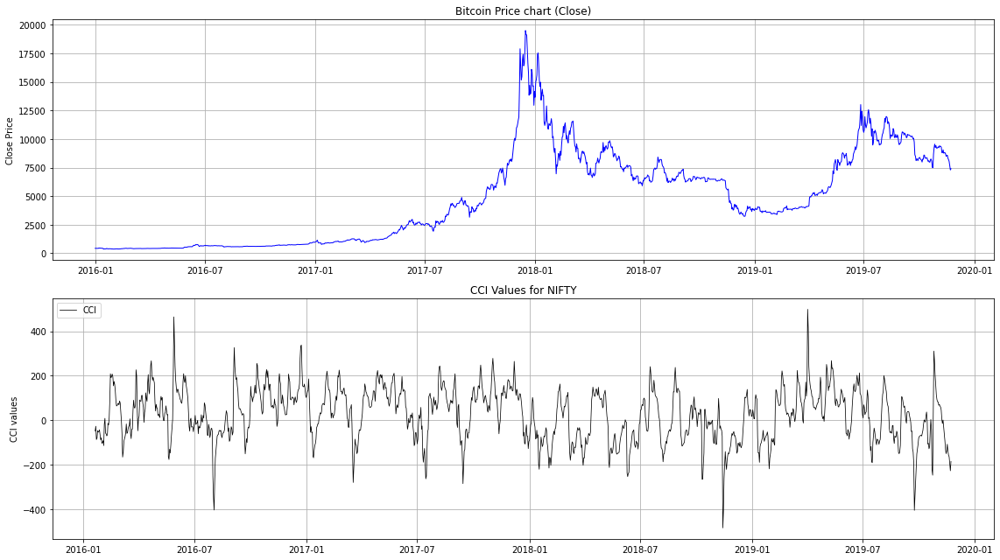

In [ ]:
# Plot the price series chart and the Commodity Channel index
fig = plt.figure(figsize=(16,9))
ax = fig.add_subplot(2, 1, 1)
plt.plot(data['Close'],lw=1,color="blue")
plt.title('Bitcoin Price chart (Close)')
plt.ylabel('Close Price')
plt.grid(True)
bx = fig.add_subplot(2, 1, 2)
plt.plot(data['CCI'],'k',lw=0.75,linestyle='-',label='CCI',color="black")
plt.title('CCI Values for NIFTY')
plt.legend(loc=2,prop={'size':9.5})
plt.ylabel('CCI values')
plt.grid(True)
plt.tight_layout()
plt.show()

## Exponential moving average

An exponential moving average (EMA) is a type of moving average (MA) that places a greater weight and significance on the most recent data points. The exponential moving average is also referred to as the exponentially weighted moving average. An exponentially weighted moving average reacts more significantly to recent price changes than a simple moving average (SMA), which applies an equal weight to all observations in the period. 

$$EMA_{today}= ClosingPrice_{today}\cdot\frac{Smoothing}{1+Days}+EMA_{yesterday}\cdot ({1-\frac{Smoothing}{1+Days}}) $$

Where:
- Smoothing=2 

In [ ]:
def EWMA(data, ndays): 
    EMA = pd.Series(data['Close'].ewm(span = ndays, min_periods = ndays).mean(), name = 'EWMA_' + str(ndays)) 
    data = data.join(EMA) 
    
    return data

##### 10-period exponential moving average

In [ ]:
data=EWMA(data,10)

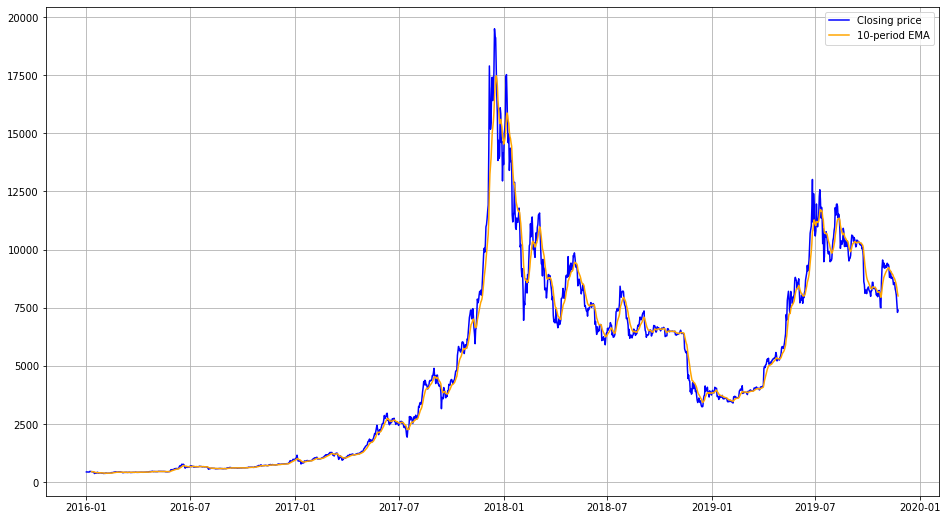

In [ ]:
plt.plot(data['Close'],label="Closing price",color="blue")
plt.plot(data['EWMA_10'],label="10-period EMA",color="orange")
plt.legend()
plt.grid(True)

##### 20-period exponential moving average

In [ ]:
data=EWMA(data,20)

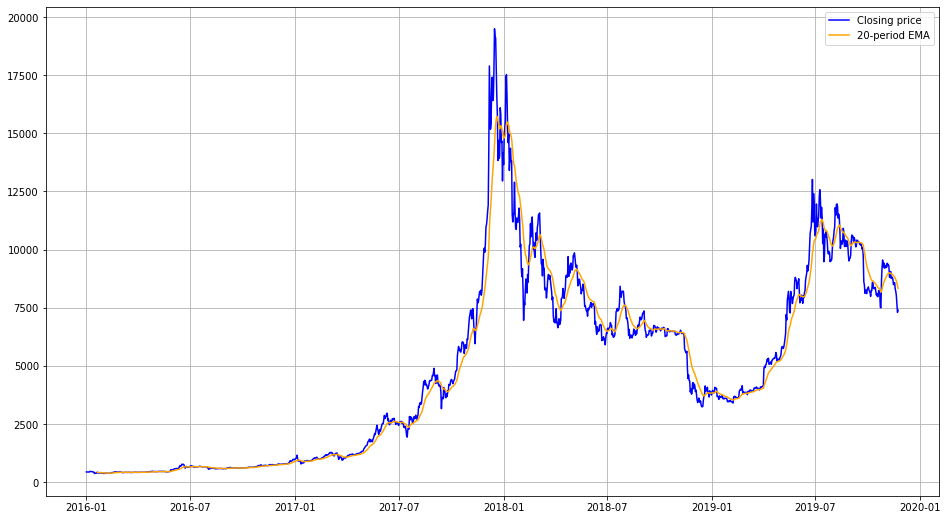

In [ ]:
plt.plot(data['Close'],label="Closing price",color="blue")
plt.plot(data['EWMA_20'],label="20-period EMA",color="orange")
plt.legend()
plt.grid(True)

##### 50-period exponential moving average

In [ ]:
data=EWMA(data,50)

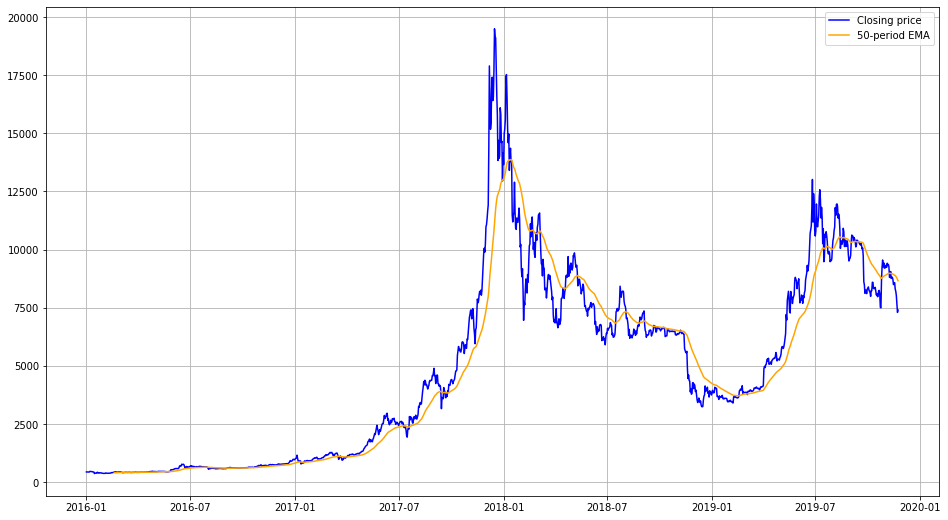

In [ ]:
plt.plot(data['Close'],label="Closing price",color="blue")
plt.plot(data['EWMA_50'],label="50-period EMA",color="orange")
plt.legend()
plt.grid(True)

##### 100-period exponential moving average

In [ ]:
data=EWMA(data,100)

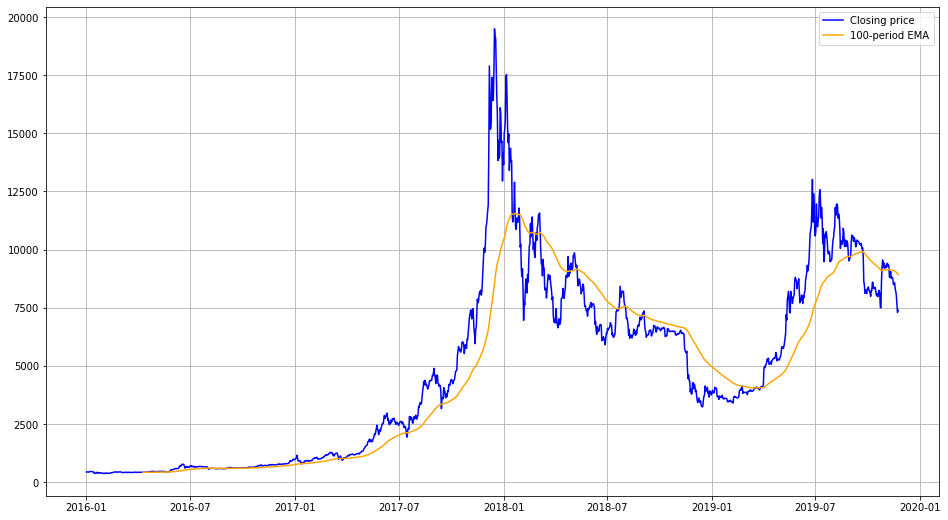

In [ ]:
plt.plot(data['Close'],label="Closing price",color="blue")
plt.plot(data['EWMA_100'],label="100-period EMA",color="orange")
plt.legend()
plt.grid(True)

## RSI
The Relative Strength Index (RSI) is a momentum oscillator that measures the speed and change of price movements. The RSI oscillates between 0 and 100. Traditionally the RSI is considered overbought when above 70 and oversold when below 30. Signals can be generated by looking for divergences and failure swings. RSI can also be used to identify the general trend.

RSI = 100 – [100 / ( 1 + (Average of Upward Price Change / Average of Downward Price Change ) ) ]

In [ ]:
n = 14
def rma(x, n, y0):
    a = (n-1) / n
    ak = a**np.arange(len(x)-1, -1, -1)
    return np.r_[np.full(n, np.nan), y0, np.cumsum(ak * x) / ak / n + y0 * a**np.arange(1, len(x)+1)]

data['change'] = data['Close'].diff()
data['gain'] = data.change.mask(data.change < 0, 0.0)
data['loss'] = -data.change.mask(data.change > 0, -0.0)
data['avg_gain'] = rma(data.gain[n+1:].to_numpy(), n, np.nansum(data.gain.to_numpy()[:n+1])/n)
data['avg_loss'] = rma(data.loss[n+1:].to_numpy(), n, np.nansum(data.loss.to_numpy()[:n+1])/n)
data['rs'] = data.avg_gain / data.avg_loss
data['rsi_14'] = 100 - (100 / (1 + data.rs))

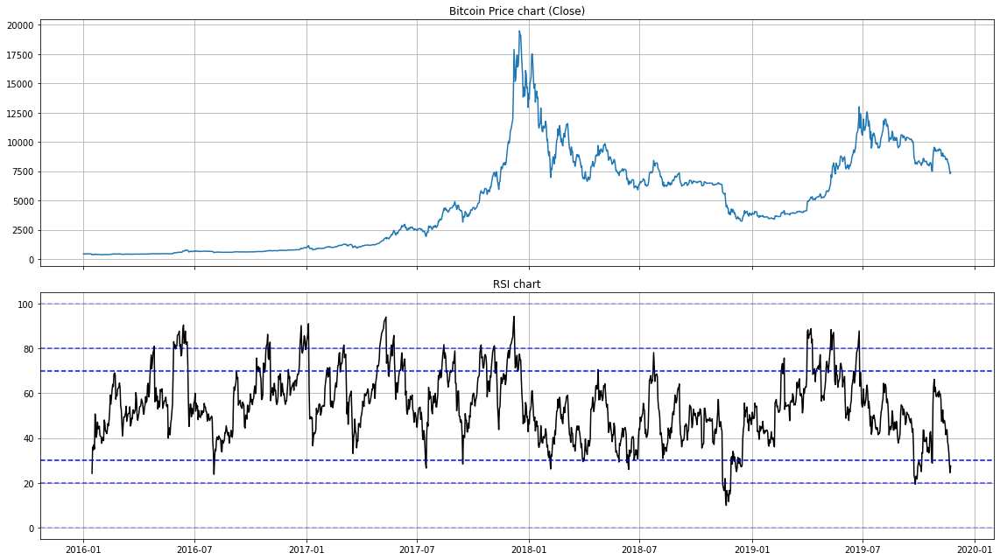

In [ ]:
# plot price
fig, axes = plt.subplots(2, 1, sharex=True)
plt.grid(True)
plt.title('Bitcoin Price chart (Close)')
axes[0].plot(data["Close"])
axes[0].grid(True)
axes[0].title.set_text('Bitcoin Price chart (Close)')

# plot correspondingRSI values and significant levels

axes[1].plot(data['rsi_14'],color="black")
axes[1].axhline(0, linestyle='--', alpha=0.3,color="blue")
axes[1].axhline(20, linestyle='--', alpha=0.7,color="blue")
axes[1].axhline(30, linestyle='--',color="blue")

axes[1].axhline(70, linestyle='--',color="blue")
axes[1].axhline(80, linestyle='--', alpha=0.7,color="blue")
axes[1].axhline(100, linestyle='--', alpha=0.3,color="blue")

axes[1].grid(True)
axes[1].title.set_text('RSI chart')
plt.tight_layout()

## Momentum
Momentum is the speed or velocity of price changes in a stock, security, or tradable instrument. Momentum shows the rate of change in price movement over a period of time to help investors determine the strength of a trend. Stocks that tend to move with the strength of momentum are called momentum stocks. 

Market momentum is measured by continually taking price differences for a fixed time interval. To construct a 10-day momentum line, simply subtract the closing price 10 days ago from the last closing price. This positive or negative value is then plotted around a zero line. 

$$Momentum=V−V_x $$

Where:
- V=Latest price <br> 
- V<sub>x</sub>=Closing price x days ago  

In [ ]:
data["Momentum(10)"]=data["Close"].diff(10)

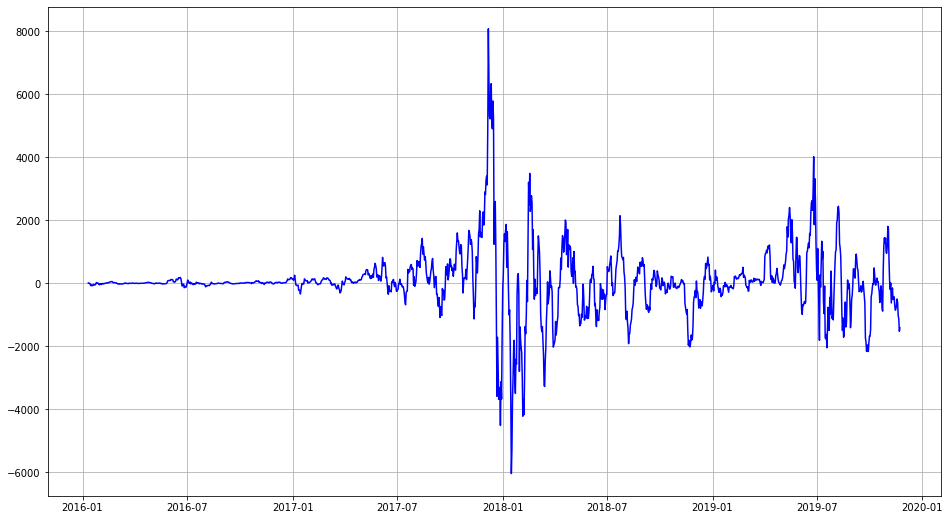

In [ ]:
plt.plot(data["Momentum(10)"],color="blue")
plt.grid(True)
plt.show()

## MACD Level (12, 26)

Moving Average Convergence Divergence (MACD) is a trend following indicator. MACD can be calculated very simply by subtracting the 26 period EMA from the 12 period EMA.<br>
MACD is commonly used by analyzing crossovers, divergences (can be used to find a changing trend), and periods of steep slope (positive or negative, can show signal of an overbought or oversold situation). Along with the MACD line (from subtracting the 12 period EMA from the 16 period EMA) the chart commonly will include a signal line plotted on top of the MACD. This signal line is a 9 day EMA of the MACD. 


In [ ]:
exp1 = data.Close.ewm(span=12, adjust=False).mean()
exp2 = data.Close.ewm(span=26, adjust=False).mean()

In [ ]:
data["MACD"]=exp1-exp2
data["MACD"]

Date
2016-01-01      0.000000
2016-01-02     -0.071478
2016-01-03     -0.400044
2016-01-04     -0.407209
2016-01-05     -0.498405
                 ...    
2019-11-19   -114.999973
2019-11-20   -154.234310
2019-11-21   -213.889613
2019-11-22   -285.805499
2019-11-23   -330.818343
Name: MACD, Length: 1423, dtype: float64

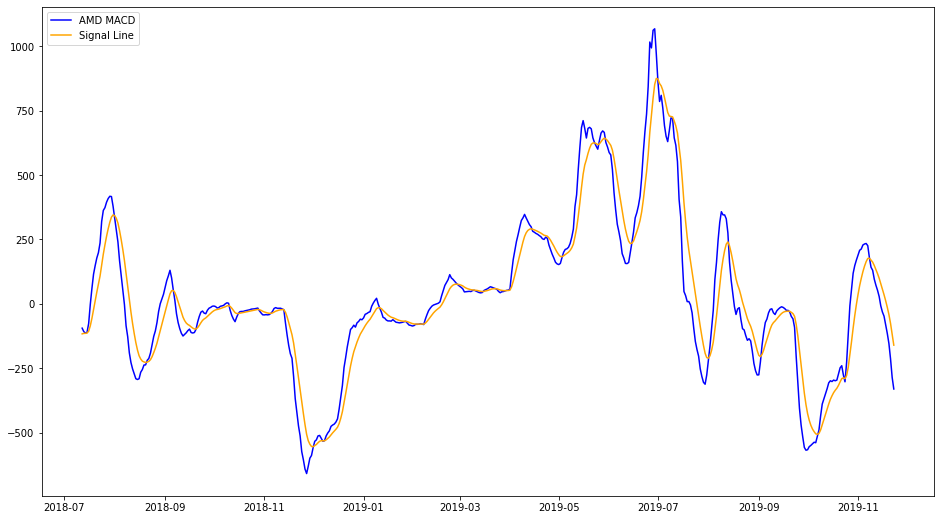

In [ ]:
data["exp3"]= data["MACD"].ewm(span=9, adjust=False).mean()
plt.plot(data["MACD"][len(data["MACD"])-500:len(data["MACD"])], label='AMD MACD',color="blue")
plt.plot(data["exp3"][len(data["MACD"])-500:len(data["MACD"])], label='Signal Line',color="orange")
plt.legend(loc='upper left')
plt.show()

## Simple moving average

In [ ]:
data["MA_(10)"] = data["Close"].rolling(window=10).mean()

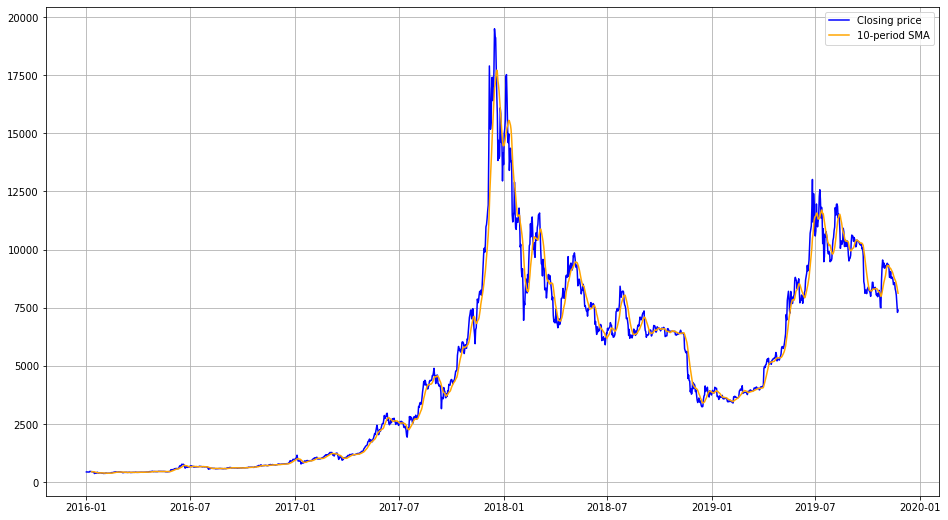

In [ ]:
plt.plot(data['Close'],label="Closing price",color="blue")
plt.plot(data['MA_(10)'],label="10-period SMA",color="orange")
plt.legend()
plt.grid(True)

##### 20-period simple moving average

In [ ]:
data["MA_(20)"] = data["Close"].rolling(window=20).mean()

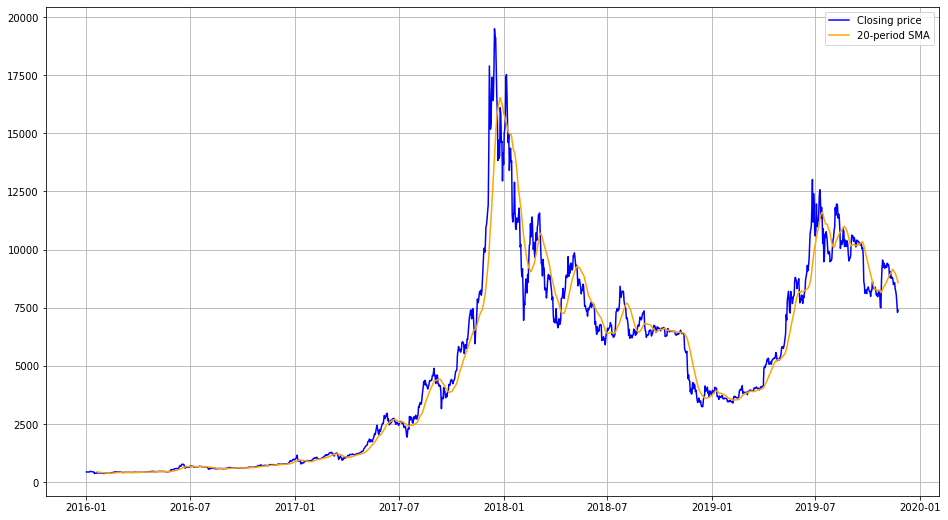

In [ ]:
plt.plot(data['Close'],label="Closing price",color="blue")
plt.plot(data['MA_(20)'],label="20-period SMA",color="orange")
plt.legend()
plt.grid(True)

##### 50-period simple moving average

In [ ]:
data["MA_(50)"] = data["Close"].rolling(window=50).mean()

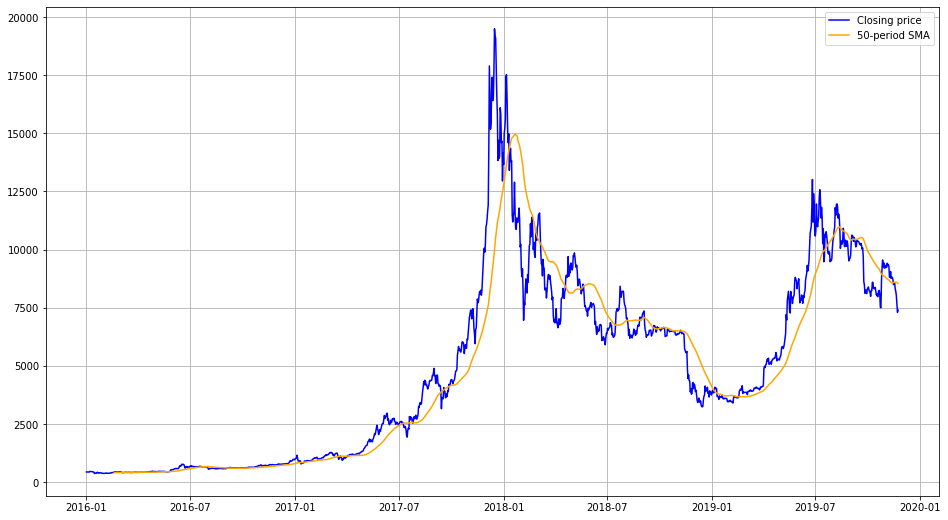

In [ ]:
plt.plot(data['Close'],label="Closing price",color="blue")
plt.plot(data['MA_(50)'],label="50-period SMA",color="orange")
plt.legend()
plt.grid(True)

##### 100-period simple moving average

In [ ]:
data["MA_(100)"] = data["Close"].rolling(window=100).mean()

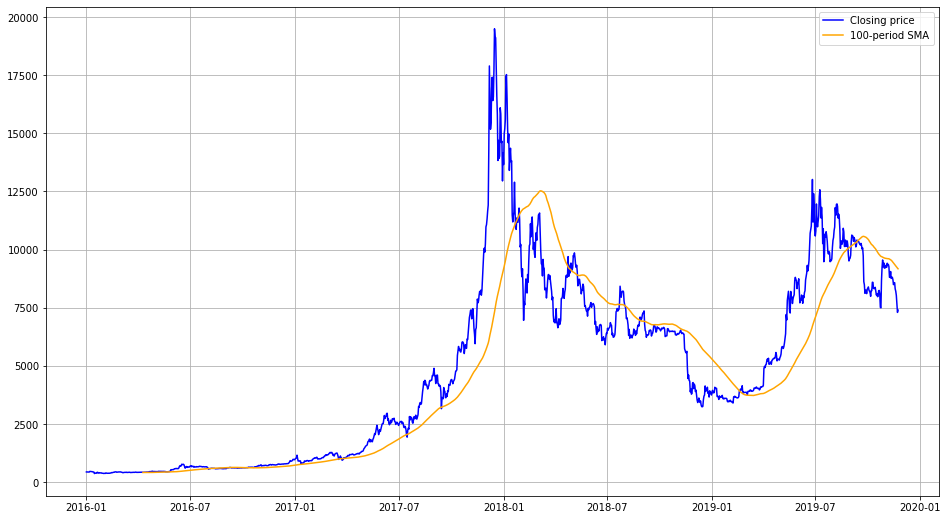

In [ ]:
plt.plot(data['Close'],label="Closing price ",color="blue")
plt.plot(data['MA_(100)'],label="100-period SMA",color="orange")
plt.legend()
plt.grid(True)

## Average Directional Index (14)

The average directional index (ADX) is a technical analysis indicator used by some traders to determine the strength of a trend.  The trend can be either up or down, and this is shown by two accompanying indicators, the negative directional indicator (-DI) and the positive directional indicator (+DI). Therefore, the ADX commonly includes three separate lines. These are used to help assess whether a trade should be taken long or short, or if a trade should be taken at all. 

 The ADX requires a sequence of calculations due to the multiple lines in the indicator.

\begin{aligned} &\text{+DI} = \left ( \frac{ \text{Smoothed +DM} }{ \text{ATR } } \right ) \times 100 \\ &\text{-DI} = \left ( \frac{ \text{Smoothed -DM} }{ \text{ATR } } \right ) \times 100 \\ &\text{DX} = \left ( \frac{ \mid \text{+DI} - \text{-DI} \mid }{ \mid \text{+DI} + \text{-DI} \mid } \right ) \times 100 \\ &\text{ADX} = \frac{ ( \text{Prior ADX} \times 13 ) + \text{Current ADX} }{ 14 } \\ &\textbf{where:}\\ &\text{+DM (Directional Movement)} = \text{Current High} - \text{PH} \\ &\text{PH} = \text{Previous High} \\ &\text{-DM} = \text{Previous Low} - \text{Current Low} \\ &\text{Smoothed +/-DM} = \textstyle{ \sum_{t=1}^{14} \text{DM} - \left ( \frac{ \sum_{t=1}^{14} \text{DM} }{ 14 } \right ) + \text{CDM} } \\ &\text{CDM} = \text{Current DM} \\ &\text{ATR} = \text{Average True Range} \\ \end{aligned}



The ADX identifies a strong trend when the ADX is over 25 and a weak trend when the ADX is below 20. Crossovers of the -DI and +DI lines can be used to generate trade signals. For example, if the +DI line crosses above the -DI line and the ADX is above 20, or ideally above 25, then that is a potential signal to buy. On the other hand, if the -DI crosses above the +DI, and the ADX is above 20 or 25, then that is an opportunity to enter a potential short trade.  Crosses can also be used to exit current trades. For example, if long, exit when the -DI crosses above the +DI. Meanwhile, when the ADX is below 20 the indicator is signaling that the price is trendless and that it might not be an ideal time to enter a trade. 

In [ ]:
def ADX(data: pd.DataFrame, period: int):
    """
    Computes the ADX indicator.
    """
    
    df = data.copy()
    alpha = 1/period

    # TR
    df['H-L'] = df['High'] - df['Low']
    df['H-C'] = np.abs(df['High'] - df['Close'].shift(1))
    df['L-C'] = np.abs(df['Low'] - df['Close'].shift(1))
    df['TR'] = df[['H-L', 'H-C', 'L-C']].max(axis=1)
    del df['H-L'], df['H-C'], df['L-C']

    # ATR
    df['ATR'] = df['TR'].ewm(alpha=alpha, adjust=False).mean()

    # +-DX
    df['H-pH'] = df['High'] - df['High'].shift(1)
    df['pL-L'] = df['Low'].shift(1) - df['Low']
    df['+DX'] = np.where(
        (df['H-pH'] > df['pL-L']) & (df['H-pH']>0),
        df['H-pH'],
        0.0
    )
    df['-DX'] = np.where(
        (df['H-pH'] < df['pL-L']) & (df['pL-L']>0),
        df['pL-L'],
        0.0
    )
    del df['H-pH'], df['pL-L']

    # +- DMI
    df['S+DM'] = df['+DX'].ewm(alpha=alpha, adjust=False).mean()
    df['S-DM'] = df['-DX'].ewm(alpha=alpha, adjust=False).mean()
    df['+DMI'] = (df['S+DM']/df['ATR'])*100
    df['-DMI'] = (df['S-DM']/df['ATR'])*100
    del df['S+DM'], df['S-DM']

    # ADX
    df['DX'] = (np.abs(df['+DMI'] - df['-DMI'])/(df['+DMI'] + df['-DMI']))*100
    df['ADX'] = df['DX'].ewm(alpha=alpha, adjust=False).mean()
    del df['DX'], df['ATR'], df['TR'], df['-DX'], df['+DX']

    return df

In [ ]:
data=ADX(data,14)

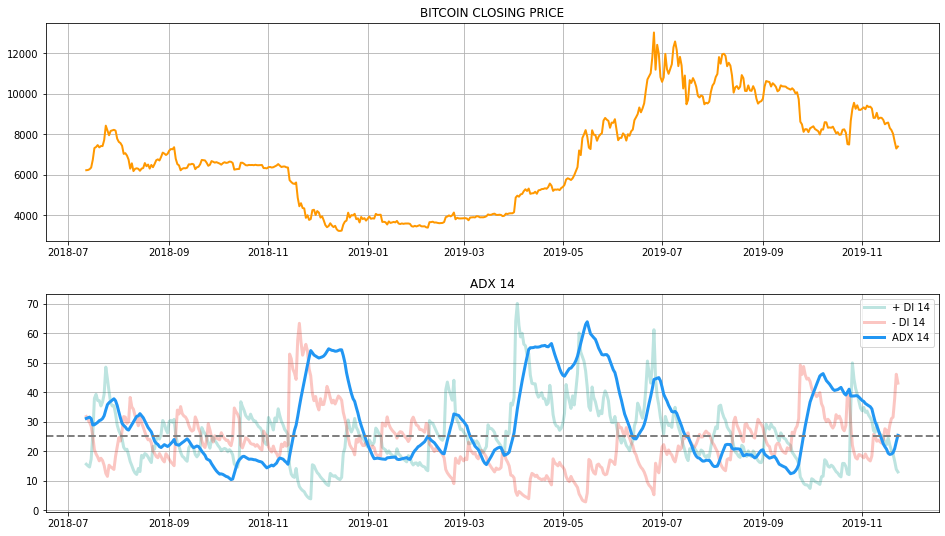

In [ ]:
ax1 = plt.subplot2grid((11,1), (0,0), rowspan = 5, colspan = 1)
ax2 = plt.subplot2grid((11,1), (6,0), rowspan = 5, colspan = 1)
ax1.plot(data['Close'][len(data['Close'])-500:len(data['Close'])], linewidth = 2, color = '#ff9800')
ax1.set_title('BITCOIN CLOSING PRICE')
ax1.grid("True")
ax2.plot(data['+DMI'][len(data['Close'])-500:len(data['Close'])], color = '#26a69a', label = '+ DI 14', linewidth = 3, alpha = 0.3)
ax2.plot(data['-DMI'][len(data['Close'])-500:len(data['Close'])] , color = '#f44336', label = '- DI 14', linewidth = 3, alpha = 0.3)
ax2.plot(data['ADX'][len(data['Close'])-500:len(data['Close'])], color = '#2196f3', label = 'ADX 14', linewidth = 3)
ax2.axhline(25, color = 'grey', linewidth = 2, linestyle = '--')
ax2.grid("True")
ax2.legend()
ax2.set_title('ADX 14')
plt.show()

## Stochastic K

A stochastic oscillator is a momentum indicator comparing a particular closing price of a security to a range of its prices over a certain period of time. The sensitivity of the oscillator to market movements is reducible by adjusting that time period or by taking a moving average of the result. It is used to generate overbought and oversold trading signals, utilizing a 0–100 bounded range of values. 

The Formula for the Stochastic Oscillator Is

\begin{aligned} &\text{%K}=\left(\frac{\text{C} - \text{L14}}{\text{H14} - \text{L14}}\right)\times100\\ &\textbf{where:}\\ &\text{C = The most recent closing price}\\ &\text{L14 = The lowest price traded of the 14 previous}\\ &\text{trading sessions}\\ &\text{H14 = The highest price traded during the same}\\ &\text{14-day period}\\ &\text{%K = The current value of the stochastic indicator}\\ \end{aligned}

%K is referred to sometimes as the fast stochastic indicator. The "slow" stochastic indicator is taken as %D = 3-period moving average of %K. <br>
The stochastic oscillator is range-bound, meaning it is always between 0 and 100. This makes it a useful indicator of overbought and oversold conditions. Traditionally, readings over 80 are considered in the overbought range, and readings under 20 are considered oversold.

In [ ]:
highest_high=data["High"].rolling(14).max()
lowest_low=data["Low"].rolling(14).min()

data["Stochastic(14)"]=(data["Close"]-lowest_low)/(highest_high-lowest_low)*100

In [ ]:
data["Stochastic(3)"] = data["Stochastic(14)"].rolling(window=3).mean()

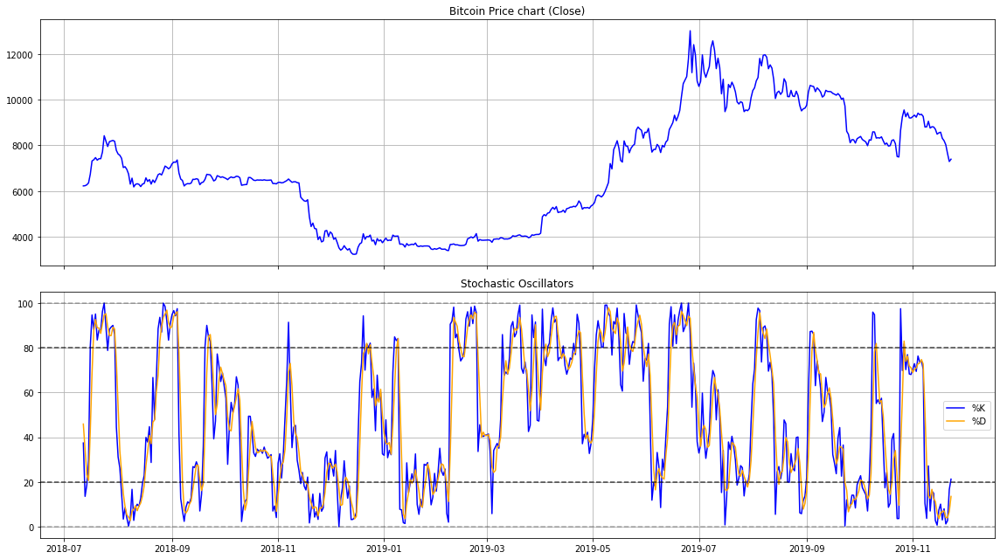

In [ ]:
fig, axes = plt.subplots(2, 1, sharex=True)
plt.grid(True)
plt.title('Bitcoin Price chart (Close)')
axes[0].plot(data["Close"][len(data["Close"])-500:len(data["Close"])],color="blue")
axes[0].grid(True)
axes[0].title.set_text('Bitcoin Price chart (Close)')

axes[1].plot(data["Stochastic(14)"][len(data["Close"])-500:len(data["Close"])],label="%K",color="blue")
axes[1].plot(data["Stochastic(3)"][len(data["Close"])-500:len(data["Close"])],label="%D",color="orange")
axes[1].axhline(0, linestyle='--', alpha=0.3,color="black")
axes[1].axhline(20, linestyle='--', alpha=0.7,color="black")

axes[1].axhline(80, linestyle='--', alpha=0.7,color="black")
axes[1].axhline(100, linestyle='--', alpha=0.3,color="black")

axes[1].grid(True)
axes[1].title.set_text('Stochastic Oscillators')
axes[1].legend()
plt.tight_layout()

##  Williams Percent Range

Williams %R, also known as the Williams Percent Range, is a type of momentum indicator that moves between 0 and -100 and measures overbought and oversold levels. The Williams %R may be used to find entry and exit points in the market. The indicator is very similar to the Stochastic oscillator and is used in the same way.

$$ \frac{Highest High-Close}{Highest High -Lowest Low} $$

Where:
- Highest High=Highest price in the lookbackperiod, typically 14 days <br> 
- Close=Most recent closing price <br>
-Lowest Low=Lowest price in the lookbackperiod, typically 14 days <br>

The indicator is telling a trader where the current price is relative to the highest high over the last 14 periods (or whatever number of lookback periods is chosen).
When the indicator is between -20 and zero the price is overbought, or near the high of its recent price range. When the indicator is between -80 and -100 the price is oversold, or far from the high of its recent range.

During an uptrend, traders can watch for the indicator to move below -80. When the price starts moving up, and the indicator moves back above -80, it could signal that the uptrend in price is starting again. It can also be used  for downtrends as well as to watch momentum failures.


In [ ]:
data["Williams Percent Range (14)"]=(highest_high-data["Close"])/(highest_high-lowest_low)*(-100)

## Stationarity Bitcoin Dataset

Then, we created the autocorrelation as well as the partial autocorrelation plots to check if our time series are stationary. This information is going to be useful later in two SARIMAX models that are going to predict for each time step which are the prices of the gold and the bitcoin for the next ten days as well as their confidence intervals.

It is really important to use stationary data when we do predictions with ARIMA models in order to have valid and remarkable predictions.   


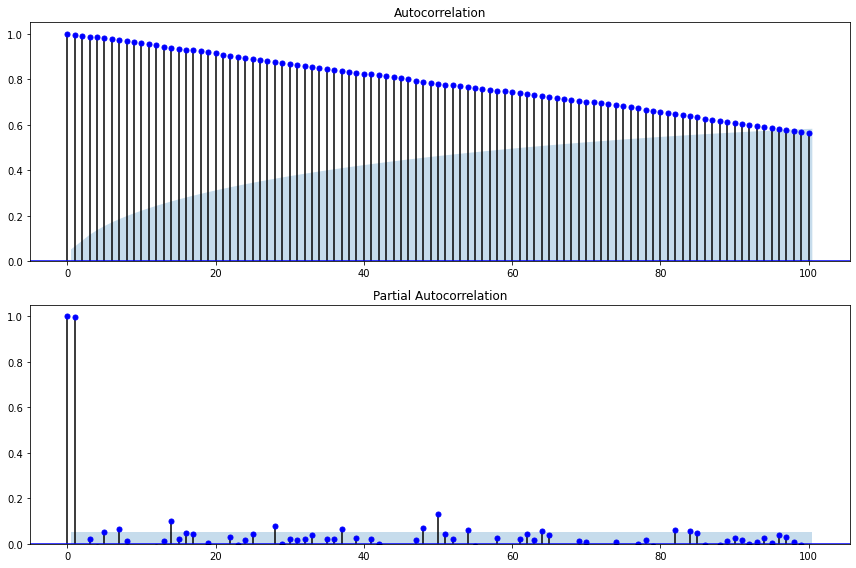

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12, 8))
plot_acf(data['Close'], lags=100, ax=ax1,color="blue")
plot_pacf(data['Close'], lags=100, ax=ax2,color="blue")
ax1.set_ylim(0,1.05)
ax2.set_ylim(0,1.05)
plt.tight_layout()
plt.show()

Observing the acf plot, we can conclude that the ACF for the price do not converge to zero within a meaningful time point. The process is non-stationary. Let's try  a first order difference.

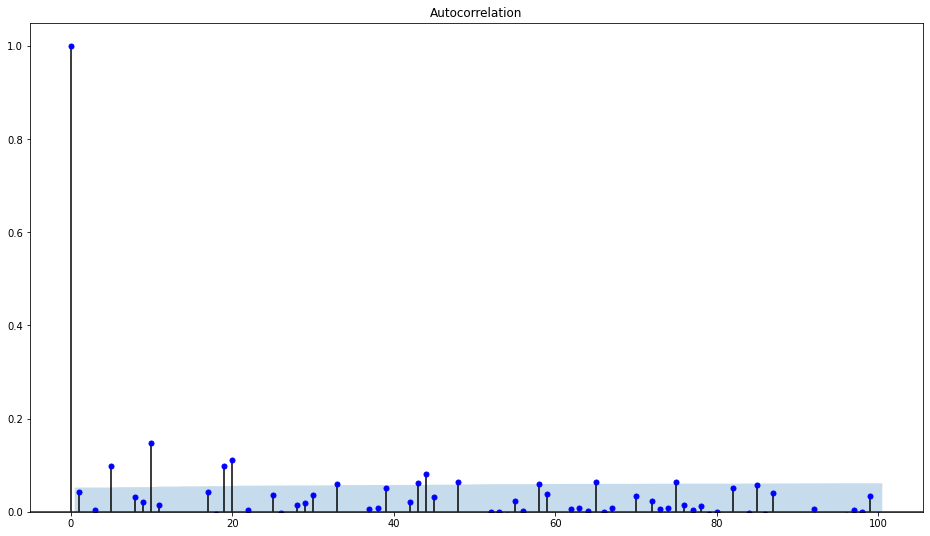

In [ ]:
plot_acf(data['Close'].diff()[1:], lags=100,color="blue")
plt.ylim(0,1.05)
plt.show()

Here we can definenetely see that the process has become stationary. 

We can also apply logarithmic transformation in order to stabilize the variance.

In [ ]:
data["log_Close_diff"]=np.log(data['Close']).diff()
data["log_Close_diff"]

Date
2016-01-01         NaN
2016-01-02   -0.002065
2016-01-03   -0.007938
2016-01-04    0.007137
2016-01-05   -0.002615
                ...   
2019-11-19   -0.012490
2019-11-20   -0.022039
2019-11-21   -0.049087
2019-11-22   -0.046352
2019-11-23    0.013777
Name: log_Close_diff, Length: 1423, dtype: float64

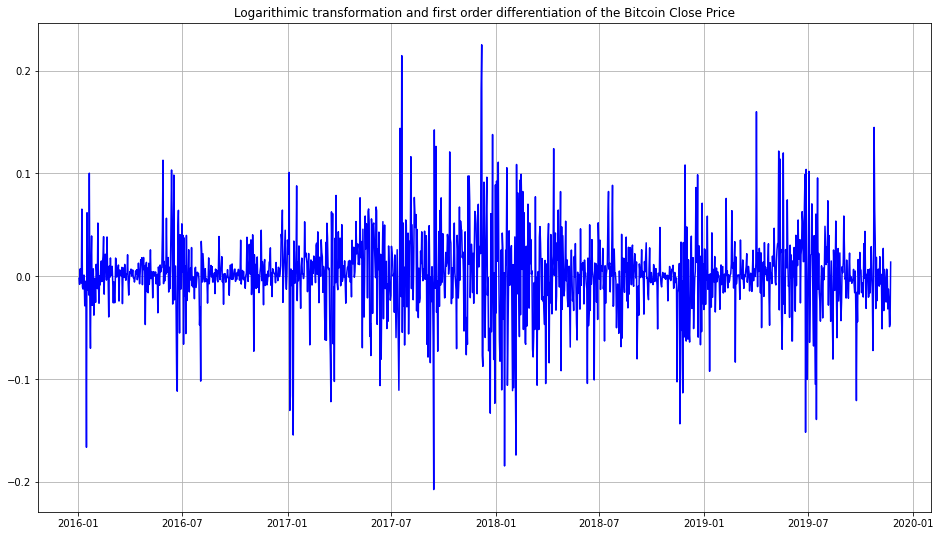

In [ ]:
plt.plot(data["log_Close_diff"][1:],color="blue")
plt.grid()
plt.title("Logarithimic transformation and first order differentiation of the Bitcoin Close Price")
plt.show()

In [ ]:
data["log_Close_diff"]=np.log(data['Close']).diff()
data["log_Low_diff"]=np.log(data['Low']).diff()
data["log_Open_diff"]=np.log(data['Open']).diff()
data["log_High_diff"]=np.log(data['High']).diff()
data["log_Volume_diff"]=np.log(data['Volume']).diff()
data_BTC=data
data_BTC.columns = [str(col) + '_BTC' for col in data_BTC.columns]


In [ ]:
data_BTC= data_BTC[['Open_BTC', 'High_BTC', 'Low_BTC', 'Close_BTC',"CCI_BTC",'Volume_BTC',"EWMA_10_BTC", "EWMA_20_BTC", "EWMA_50_BTC", "EWMA_100_BTC", "rsi_14_BTC", "Momentum(10)_BTC", "MACD_BTC", "MA_(10)_BTC", "MA_(20)_BTC", "MA_(50)_BTC", "MA_(100)_BTC", "ADX_BTC", "+DMI_BTC","-DMI_BTC", "Stochastic(3)_BTC", "Stochastic(14)_BTC", "Williams Percent Range (14)_BTC","log_Low_diff_BTC","log_Volume_diff_BTC", "log_High_diff_BTC", "log_Open_diff_BTC",  "log_Close_diff_BTC"]]

<center> <h1> Create useful technical indicators for GOLD Dataset</h1> </center>                                         

We downloaded GOLD data by using the **yfinance** library 

In [ ]:
start = datetime.datetime(2016,1,1)
end = datetime.datetime(2019,11,23)
data = yf.download(tickers='GC=F', start=start, end=end, interval='1d')

[*********************100%***********************]  1 of 1 completed


With the same logic as before, we built the same financial idicators for our gold dataset 

In [ ]:
#CCI
data=CCI(data,20)

#Exponential Moving Average
data=EWMA(data,10)
data=EWMA(data,20)
data=EWMA(data,50)
data=EWMA(data,100)

#RSI

data['change'] = data['Close'].diff()
data['gain'] = data.change.mask(data.change < 0, 0.0)
data['loss'] = -data.change.mask(data.change > 0, -0.0)
data['avg_gain'] = rma(data.gain[n+1:].to_numpy(), n, np.nansum(data.gain.to_numpy()[:n+1])/n)
data['avg_loss'] = rma(data.loss[n+1:].to_numpy(), n, np.nansum(data.loss.to_numpy()[:n+1])/n)
data['rs'] = data.avg_gain / data.avg_loss
data['rsi_14'] = 100 - (100 / (1 + data.rs))

#Momentum
data["Momentum(10)"]=data["Close"].diff(10)

#MACD
exp1 = data.Close.ewm(span=12, adjust=False).mean()
exp2 = data.Close.ewm(span=26, adjust=False).mean()
data["MACD"]=exp1-exp2

# Simple moving average
data["MA_(10)"] = data["Close"].rolling(window=10).mean()
data["MA_(20)"] = data["Close"].rolling(window=20).mean()
data["MA_(50)"] = data["Close"].rolling(window=50).mean()
data["MA_(100)"] = data["Close"].rolling(window=100).mean()

#Average Directional Index
data=ADX(data,14)

#Stochastic K
data["Stochastic(14)"]=(data["Close"]-lowest_low)/(highest_high-lowest_low)*100
data["Stochastic(3)"] = data["Stochastic(14)"].rolling(window=3).mean()

#Williams Percent Range
data["Williams Percent Range (14)"]=(highest_high-data["Close"])/(highest_high-lowest_low)*(-100)

## Stationarity Gold Dataset

The stationarity check for the gold datatset is presented below:

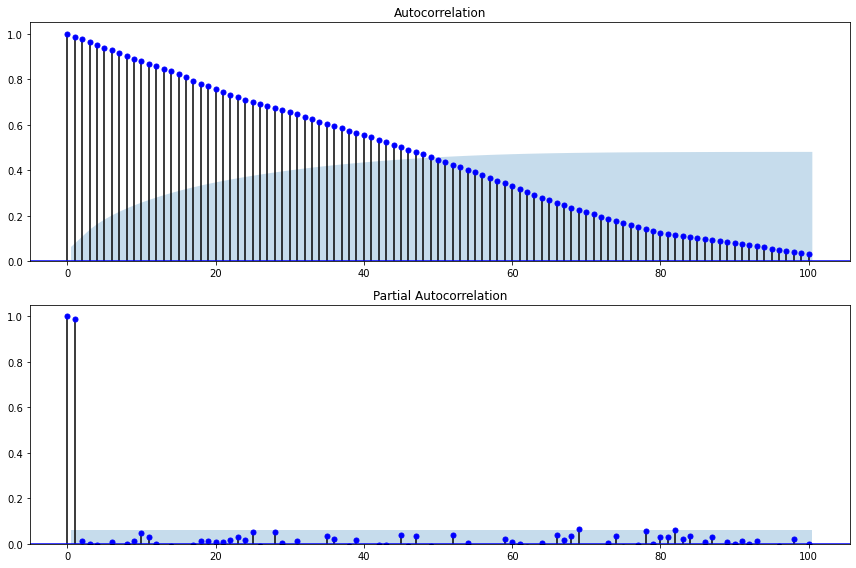

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12, 8))
plot_acf(data['Close'], lags=100, ax=ax1,color="blue")
plot_pacf(data['Close'], lags=100, ax=ax2,color="blue")
ax1.set_ylim(0,1.05)
ax2.set_ylim(0,1.05)
plt.tight_layout()
plt.show()

Observing the acf plot, we can conclude that the ACF for the price do not converge to zero within a meaningful time point. The process is non-stationary. Let's try a first order difference.

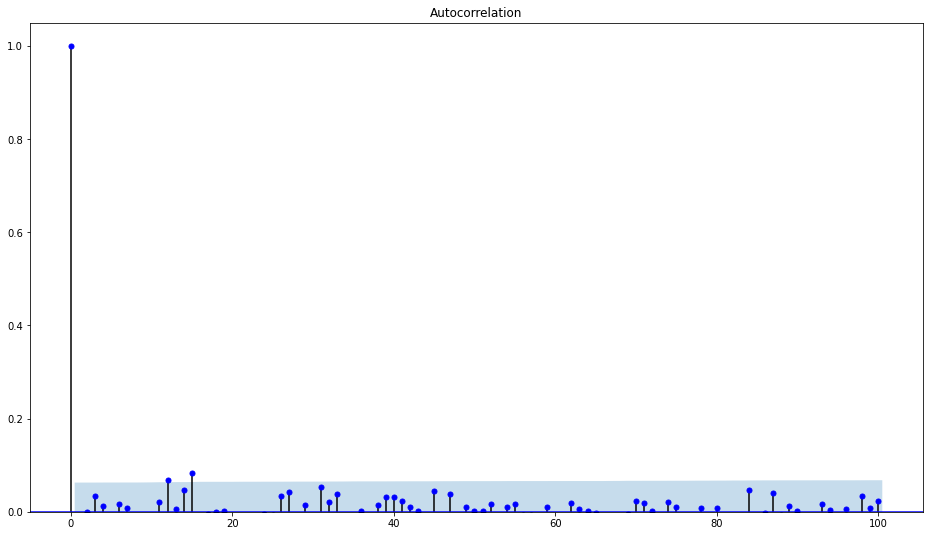

In [ ]:
plot_acf(data['Close'].diff()[1:], lags=100,color="blue")
plt.ylim(0,1.05)
plt.show()

Here we can definenetely see that the process has become stationary.

We can also apply logarithmic transformation in order to stabilize the variance.


In [ ]:
data["log_Close_diff"]=np.log(data['Close']).diff()
data["log_Close_diff"]

Date
2016-01-04         NaN
2016-01-05    0.003065
2016-01-06    0.012441
2016-01-07    0.014366
2016-01-08   -0.008978
                ...   
2019-11-18    0.002450
2019-11-19    0.001630
2019-11-20    0.000000
2019-11-21   -0.006947
2019-11-22    0.000000
Name: log_Close_diff, Length: 978, dtype: float64

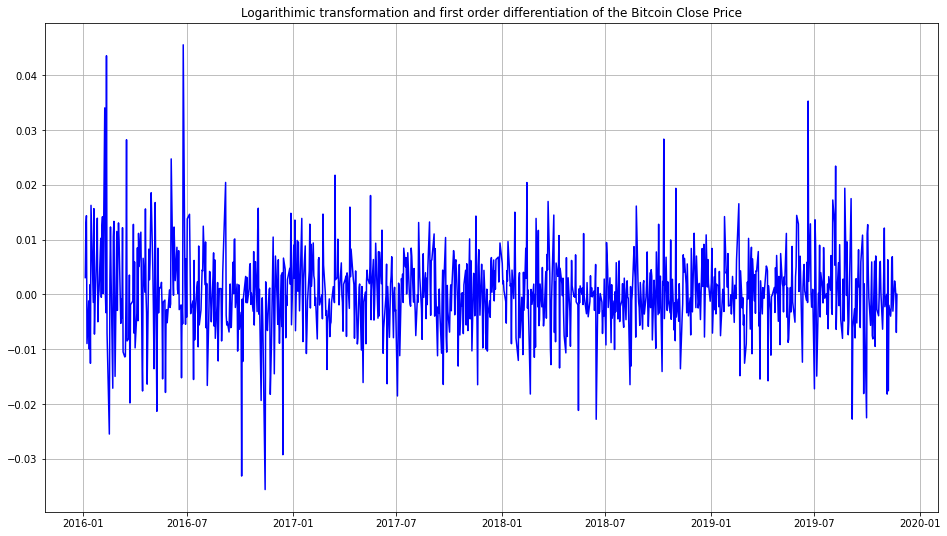

In [ ]:
plt.plot(data["log_Close_diff"][1:],color="blue")
plt.grid()
plt.title("Logarithimic transformation and first order differentiation of the Bitcoin Close Price")
plt.show()

In [ ]:
data["log_Close_diff"]=np.log(data['Close']).diff()
data["log_Low_diff"]=np.log(data['Low']).diff()
data["log_Open_diff"]=np.log(data['Open']).diff()
data["log_High_diff"]=np.log(data['High']).diff()
data["log_Volume_diff"]=np.log(data['Volume']).diff()
data_GOLD=data
data_GOLD.columns = [str(col) + '_GOLD' for col in data_GOLD.columns]

In [ ]:
data_GOLD=data_GOLD[['Open_GOLD', 'High_GOLD', 'Low_GOLD', 'Close_GOLD',"CCI_GOLD",'Volume_GOLD',"EWMA_10_GOLD", "EWMA_20_GOLD", "EWMA_50_GOLD", "EWMA_100_GOLD", "rsi_14_GOLD", "Momentum(10)_GOLD", "MACD_GOLD", "MA_(10)_GOLD", "MA_(20)_GOLD", "MA_(50)_GOLD", "MA_(100)_GOLD", "ADX_GOLD", "+DMI_GOLD","-DMI_GOLD", "Stochastic(3)_GOLD", "Stochastic(14)_GOLD", "Williams Percent Range (14)_GOLD","log_Low_diff_GOLD","log_Volume_diff_GOLD", "log_High_diff_GOLD", "log_Open_diff_GOLD",  "log_Close_diff_GOLD"]]

Then we merged the two datasets into one

In [ ]:
data=data_BTC.join(data_GOLD,how="left")

And we filled the missing values by using forward and backward fill 

In [ ]:
data["Open_GOLD"] = data["Open_GOLD"].fillna(method="ffill").fillna(method="bfill")
data["High_GOLD"] = data["High_GOLD"].fillna(method="ffill").fillna(method="bfill")
data["Close_GOLD"] = data["Close_GOLD"].fillna(method="ffill").fillna(method="bfill")
data["Low_GOLD"] = data["Close_GOLD"].fillna(method="ffill").fillna(method="bfill")

Then we can save our datset into a csv file

In [ ]:
#Save results
path = "financial_indicators.csv"
data.to_csv(path)

# Twitter topic sentiment

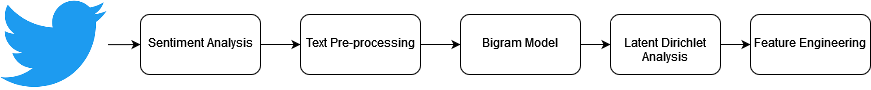

The secondth data-pipeline that we have created for the model is designed for analyzing a large amount of tweets mentioning "bitcoin" or "btc". This dataset of 16 million tweets was used as input data:

https://www.kaggle.com/datasets/alaix14/bitcoin-tweets-20160101-to-20190329

Because of the size of the dataset, and the ensuing computational complexity, all computations has been run in cloud-enabled Kaggle kernels. In this section of the notebook, we will explain the steps shown in the flowchart above, show the code that has been executed, and link to the specific Kaggle kernel/kernels which has alread executed the code. This section will not have code-blocks that are designed to be run locally, as that would be incredibly time-consuming for the user.


## Sentiment Analysis

Kaggle kernel which has executed sentiment-analysis and text-preprocessing on all 16m tweets can be found here:
https://www.kaggle.com/code/jakobpoulsen/sentiment-analysis-chunks



Sentiment analysis was conducted on all tweets, using the [Vader Sentiment Analysis](https://github.com/cjhutto/vaderSentiment) library, which is specifically designed for analyzing sentiment in social media posts. The function below defines and returns a list of sentiments in percentage: negative, neutral, positive and compound.



```
sid_obj = SentimentIntensityAnalyzer()
def sentiment(string):
    sentiment_dict = sid_obj.polarity_scores(string)
    return [sentiment_dict["neg"], sentiment_dict["neu"], sentiment_dict["pos"], sentiment_dict["compound"]]
```

## Text preprocessing

Kaggle kernel which has executed sentiment-analysis and text-preprocessing on all 16m tweets can be found here:
https://www.kaggle.com/code/jakobpoulsen/sentiment-analysis-chunks

For text-preprocessing we have implemented the following functions:

*   **Detect language**

Using the [whatthelang](https://github.com/indix/whatthelang) library to detect language. Any non-english language should then be removed from the dataset. Before whatthelang can run, we have to remove emojis. But we want to still keep emojis as they are used in the Vader Sentiment analysis. The detect_lang function below uses a regular expression to remove emojis and then runs whatthelang and returns a language for the text.
*   **Remove twitter mentions**

It is unlikely that twitter mentions will add any meaningful information to our analysis. A regular expression statement is used to remove all mentions in the tweets.
*   **Remove punctuation**

Using Python string functions and NLTK
*   **Make tweet lowercase**

Using Python string functions and NLTK
*   **Remove stopwords**

Using Python string functions and NLTK
*   **Stemming / Lemmatizing**

Using Python string functions and NLTK / WordNet



```
lemmatizer = WordNetLemmatizer()
Stop_Words= _stop_words.ENGLISH_STOP_WORDS
wtl = WhatTheLang()

def detect_lang(text):
    text = re.sub(r"\b\d+\b", "", text)
    if len(text)!=0:
        lang = wtl.predict_lang(text)
    else:
        lang = None
    return lang

def text_processing(text):

    #remove mentions
    text = re.sub("@[A-Za-z0-9]+","", text)
    
    # remove punctuation 
    text = "".join([c for c in text 
                    if c not in string.punctuation])
    # lowercase
    text = "".join([c.lower() for c in text])
    # remove stopwords
    text = " ".join([w for w in text.split() 
                     if w not in Stop_Words])
    # stemming / lematizing (optional)
    text = " ".join([lemmatizer.lemmatize(w) for w in text.split()])
    return text
```



## Executing sentiment analysis and text pre-processing

Kaggle kernel which has executed sentiment-analysis and text-preprocessing on all 16m tweets can be found here:
https://www.kaggle.com/code/jakobpoulsen/sentiment-analysis-chunks

Now the challenge is to execute everything efficiently and within memory-limits of the kernel. We constructed the pipe-line below to minimize the computational time, by running the lighter language function first and sorting non-english tweets out, such that we have to run less sentiment analysis.
Then, in order to stay within memory-limits, we loaded the dataframe in chunks and performed the analysis on one chunk at a time. The end result is 40 dataframe "chunks" that has cleaned tweets and negative, neutral and positive sentiments in percentages attached.

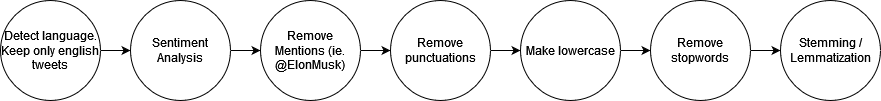



```
chunksize = 1000000
result = None
for idx,chunk in enumerate(pd.read_csv('/kaggle/input/bitcoin-tweets-20160101-to-20190329/tweets.csv', low_memory = False, delimiter=';', skiprows=0, lineterminator='\n', 
                 usecols = ['timestamp', 'text\r','replies','likes','retweets'],encoding = "utf-8",
                 quotechar=None, quoting=3,on_bad_lines="skip",chunksize=chunksize)):
    chunk = chunk.dropna()
    chunk['lang'] = chunk["text\r"].apply(detect_lang)
    chunk = chunk[chunk['lang'] == "en"]
    chunk_result = chunk["text\r"].apply(sentiment).apply(pd.Series)
    chunk_result.columns = ["negative","neutral","positive","compound"]
    chunk["text\r"] = chunk["text\r"].apply(text_processing)
    chunk = chunk.join(chunk_result)
    chunk.to_csv("senti_chunk{}.csv".format(idx))
```



## Bigram

Kaggle kernel which creates the bigram and lda models can be found here:
https://www.kaggle.com/code/jakobpoulsen/sentiment-analysis-chunks

First, we have some data-cleaning to do, and then we may load the cleaned tweets/sentiments into memory


```
#Read all processed chunks into one dataframe and fix indices

path = r'/kaggle/input/sentiment-analysis-chunks'
all_files = glob.glob(path + "/*.csv")
li = []

for idx,filename in enumerate(all_files):
    df = pd.read_csv(filename, index_col=None, header=[0,1])
    list1, list2 = zip(*df.columns)
    head = [str(x) for x in list1[1:]] + [str(x) for x in list2[1:]]
    #df = df.reset_index(level=[0,1])
    df = df.reset_index(level=[1,2,3,4])
    df.columns = df.columns.droplevel()
    df.columns = head
    li.append(df)

frame = pd.concat(li, axis=0, ignore_index=True)
del li

def dt(x):
    date = x.split()[0]
    return str(date)

frame = frame.dropna()
frame['timestamp'] = frame['timestamp'].apply(dt)
frame['timestamp'] = pd.to_datetime(frame['timestamp'],format= '%Y-%m-%d',errors='coerce')
bad_rows = frame[(frame['timestamp'] < '2015-01-01') | (frame['timestamp'].isnull())].index
frame = frame.drop(bad_rows)
frame['retweets'] = pd.to_numeric(frame['retweets']).astype('int32')
frame['likes'] = pd.to_numeric(frame['retweets']).astype('int32')
frame['replies'] = pd.to_numeric(frame['retweets']).astype('int32')
frame = frame.sort_values(by = 'timestamp')
frame.reset_index(inplace=True,drop=True)
frame.to_csv("cleandf.csv")
```



The dataframe fits in the 16GB memory of Kaggle, but in order to train models, we need to free up some of this memory. The [Gensim](https://radimrehurek.com/gensim/) library allows some extensions of the more basic text-analysis models such as the ones seen in SKlearn. One of these extensions is the LineSentence and datapath modules, which allows you to stream sentences from disk into the training of a model. The code below saves our tweets to a file and deletes the dataframe that we have thus far used. Then we create the LineSentence object from our datapath.

```
#### TOKENIZE WORDS AND SAVE TO FILE #####
stoplist = set('bitcoin btc'.split())
with open('tweets.txt', 'w') as f:
    for tweets in frame["text"]:
        tweet = [word for word in tweets.lower().split() if word not in stoplist]
        for word in tweet:
            f.write(word)
            f.write(" ")
        f.write('\n')

del frame


from gensim.test.utils import datapath
from gensim.models.word2vec import LineSentence

sentences = LineSentence(datapath('/kaggle/working/tweets.txt'))
```



Now we may train and apply Gensim's bigram-model. Gensim models are usually trained by some iteration/convergence criteria, which makes them a lot faster than SKlearn models. But, we then do not get a transformed dataframe returned after fitting a model. So we need to apply the model after the fact. And again, we need to be mindful of memory-limitations. We do it by opening two files, the clean tweets that we have from previous steps, and another file where we directly save the bigrammed tweets, one by one. The code below executes this procedure


```
# Build the bigram model
bigram = gensim.models.Phrases(sentences=sentences, min_count=1000, threshold=80) # higher threshold fewer phrases.

# Faster way to get a sentence clubbed as a bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)

bigram_mod.save("bigram.model")

def make_bigrams(text):
    return bigram_mod[text]

with open('tweets.txt','r') as f:
    with open('tweets_bigrammed.txt','w') as f2:
        for line in f:
            line = [word for word in line.lower().split()]
            line = make_bigrams(line)
            for word in line:
                f2.write(word)
                f2.write(" ")
            f2.write("\n")
        
```



We can also print the bigrams found by the model

```
for phrase, score in gensim.models.Phrases.find_phrases(sentences=sentences,self = bigram_mod).items():
    print(phrase, score)

    
using_buysellbitcoin 106.4832159441659
10_min 96.66404608664494
arb_opps 675.9561414038978
pair_yielding 397.956311433745
profit_ranging 145.35516539764083
tl_koinim 750.7332450803344
tl_campbx 208.61209733038203
scounter_httpbitcoindunyasicom 6033.028600564904
vircurex_httpwwwprojectcoinorg 165.38470587268156
utc_24h 99.72109629685673
hardware_wallet 119.87420189821025
usd_bitapeso 81.77425975666198
precio_httpwwwbitapesocom 316.2867840923484
change_1hour 105.92392762404083
united_state 178.17563694785207
spanning_19 94.93021926736418
gift_card 177.49137744414986
24_hour 85.93948796487867
...
dacx_ieo 219.17058043736785
rub_rubbtc 352.4471384670301
ruble_rub 249.1327656797378
date_20191109 95.15545859558497
date_20191110 555.0735084742457
competition_influencer 593.4872158609278
community_boast 143.1265668233554
date_20191112 597.6051149677269
date_20191113 232.6276475762258
launching_301119 1491.498656904779
airdrop_bitnomo 114.62468751970947
nomo_airdrop 114.49348242567466
```



## Latent Dirichlet Analysis

Kaggle kernel which creates the bigram and lda models can be found here:
https://www.kaggle.com/code/jakobpoulsen/sentiment-analysis-chunks

First, we need to create a dictionary. When we create the dictionary of all words in the tweets, we may also filter extreme cases out. We do this by using the Gensim dictionary method "filter_extremes", removing entries that appears less than 30 times, and entries that appear more than 70% of the time.



```
#### CREATE DICTIONARY ###
from gensim.utils import simple_preprocess

dictionary = corpora.Dictionary(
    simple_preprocess(line, deacc =True) for line in open('tweets_bigrammed.txt', encoding='utf-8')
)

#remove words that appear rarely or very often
dictionary.filter_extremes(no_below=30, no_above=0.7)
```



And now we load the tweets into memory, as a bag-of-words representation and train the model. We have decided to have it search for 100 topics, due to the sheer volume and timeframe of tweets that we have available.

```
#### LOAD FILE INTO MEMORY ####
corpus = []
with open('tweets_bigrammed.txt', 'r') as f:
    for line in f:
        corpus.append(dictionary.doc2bow([word for word in line.lower().split()]))

#### LDA MODEL TRAINING ####

from gensim.models import LdaModel

# Set training parameters.
num_topics = 100
chunksize = 100000
passes = 2
iterations = 100
eval_every = None  # Don't evaluate model perplexity, takes too much time.

# Make a index to word dictionary.
temp = dictionary[0]  # This is only to "load" the dictionary.
id2word = dictionary.id2token

%time lda = LdaModel(corpus=corpus, id2word=id2word, chunksize=chunksize, \
                       alpha='auto', eta='auto', \
                       iterations=iterations, num_topics=num_topics, \
                       passes=passes, eval_every=eval_every)
```



### LDA visualization

Kaggle kernel which creates the wordclouds from the lda model can be found here: https://www.kaggle.com/code/jakobpoulsen/lda-model-present

One way to visualize the topics found by our model, is to generate wordclouds. The following block of code will generate wordclouds from all 100 topics in our LDA model:

```
from wordcloud import WordCloud

fig, axes = plt.subplots(34, 3, figsize=(30,150), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    plt.gca().imshow(WordCloud(max_font_size=100, max_words=100, background_color="white").fit_words(dict(lda.show_topic(i, 200))))
    plt.gca().set_title('Topic #' + str(i+1), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()
```



![picture](https://drive.google.com/uc?id=17YxD9GJQHDPF4_xJrCS8ES8OySOchjnt)

It's very interesting to see such distinct topics, even as we move down through all 100 topics! When we have such a large dataset, we can utilize this volume of tweets to generate a large amount of distinct topics!

We could also try some other tools for visualization, such as pyLDAvis, but running these methods does not fit into Kaggle's memory limitations, due to the huge size of the corpus and the number of topics in the model.

### LDA topic classification

Kaggle kernel which does the topic classification can be found here: https://www.kaggle.com/code/jakobpoulsen/lda-topic-classification

Now, because Gensim models are trained to some convergence criteria, it has not returned a full topic-distribution for our corpus. To get this, we need to run the model over all of our tweets. Two challenges had to be solved here. First, it was not possible to fit both the corpus and predictions into the memory limit of the free Kaggle kernels. So, instead of spending all of our SU on cloud computing resources, we write them directly to disk.

Secondly, the model returns a list of tuples for each topic that is deemed relevant to the tweet. These tuples must be unpacked, with the zip(*) function. Then to expand the size of the unpacked tuples to always be 1x100, we made the following one-liner:

```
prediction = [probabilities[topics.index(i)] if i in topics else 0 for i in range(1,101)]
```
And taking everything together, the block below accomplished everything described above.


```
predictions = []
with open('/kaggle/input/lda-model-training/tweets_bigrammed.txt', 'r') as f:
    with open('predictions.txt', 'w') as f2:
        for idx,line in enumerate(f):
            prediction = lda[dictionary.doc2bow([word for word in line.lower().split()])]
            topics = list(list(zip(*prediction))[0])
            probabilities = list(list(zip(*prediction))[1])
            prediction = [probabilities[topics.index(i)] if i in topics else 0 for i in range(1,101)]
            for i in prediction:
                f2.write(str(i))
                f2.write(" ")
            f2.write("\n")
```



## Feature Engineering

In the final step, we try to really boil down the dataframe as much as we can. We have the following variables to consider:


1.   Likes, replies and retweets (not all tweets are equal) - **3 integer values**
2.   Sentiments - **3 floating point values**
3.   Topic distributions **100 floating point values**

Considering that the dataset of tweets consists of, after cleaning, approximately 13 milion tweets, this means that we would have constructed a dataset of 1.339 trilion floating point values and 39 milion integer values. Which was frankly not a tenable dataset to feed into a model under any computational constraints. So, we decided that the model should make daily trading decisions, and then we would summarize our dataframe into daily entries.

**First idea:**

Taking daily sums or averages would give us the overall sentiment and topic activity on each day. It would definitely be tenable to perform the averages, and save a final dataframe of size

$|D| \times 106$

Where $|D|$ is the number of days in the dataset. This dataframe could easily fit as the observation space of a reinforcement learning agent, but there is a problem. too much information is lost, as we do not make a connection the three groups of variables mentioned above. How popular a tweet is, or the sentiment of this specific tweet mentioning a specific topic will just get grouped together in overall averages. While we would still know something about the activity of tweets, we do not know the characteristics of any tweets. We are worried that this might lose important discriminatory value.

**Final idea:**

We do some manual feature engineering where we multiply the variables.
So for every tweet, we construct the following:

**Sets:**

$$T = \{1,2,3...100\}$$

$$S = \{\text{"neg","neu","pos"}\}$$

$$P = \{\text{"tweet","likes","replies","retweets"}\}$$

$$W = \{\text{Tweets in dataset}\}$$

$$D = \{\text{Days in dataset}\}$$

**Parameters:**

Volume of tweet, likes, replies and retweets. This is allways 1 for tweet:
$$V_{w,p} \: \forall \: w\in W,p\in P$$

Tweet Sentiment:
$$TS_{w,s} \: \forall \: w\in W,s\in S$$

Tweet topic distribution
$$TT_{w,t} \: \forall \: w\in W,t\in T$$

Volumetric Topic Sentiment
$$VS_{d,p} = \sum_{w\in W} TS_{w,s} \cdot TT_{w,t} \cdot V_{w,p} \: \forall \: d\in D,p\in P$$

The final result would be a dataframe of size

$$|D|\times |T|\cdot |S|\cdot |P| = |D| \times 1200$$

1200 floating point values for every day. Quite a large observation space for an RL agent, but memorywise and computationally quite tenable. Now we just have to run more than a trilion floating point multiplications! Easy if we just spend all of our SU on cloud computing resources! Or... we could write a silly hack and run 40 free Kaggle kernels in parallel. I will not recommend either approach, but here is a block of code which can be run on a slice of the dataset while retaining the structure of indices etc.


First, to slice the dataframe
```
df = pd.read_csv('../input/lda-model-training/cleandf.csv', 
                 usecols = ['timestamp','replies','likes','retweets','negative','neutral','positive'])
df['timestamp'] = pd.to_datetime(df['timestamp'],format= '%Y-%m-%d',errors='coerce')
df = df[df['timestamp'] < '2016-10-26']
```

And then to do the feature engineering.

```
from scipy.sparse import csr_matrix, vstack
from datetime import date, timedelta
start_date = pd.to_datetime(df['timestamp'].min())
end_date = pd.to_datetime(df['timestamp'].max())
days = pd.date_range(start=start_date, end=end_date, freq='D')
neg_tweets = []
neu_tweets = []
pos_tweets = []
neg_retweets = []
neu_retweets = []
pos_retweets = []
neg_likes = []
neu_likes = []
pos_likes = []
neg_replies = []
neu_replies = []
pos_replies = []

delta = timedelta(days=1)

idx_start = df.index.min()
predictions = []
with open("../input/lda-topic-classification/predictions.txt","r") as f:
    while start_date <= end_date:
        for idx,line in enumerate(f):
            if idx>df.index.max():
                break
            if idx<idx_start:
                continue
            if idx == df[df['timestamp'] == start_date].index.max():
                prediction = csr_matrix(np.array([float(i) for i in line.lower().split()]))
                predictions.append(prediction)
                predictions = vstack(predictions)
                neg_tweets.append(csr_matrix(df.loc[idx_start:idx]["negative"].values * predictions))
                neu_tweets.append(csr_matrix(df.loc[idx_start:idx]["neutral"].values * predictions))
                pos_tweets.append(csr_matrix(df.loc[idx_start:idx]["positive"].values * predictions))
                neg_retweets.append(csr_matrix((df.loc[idx_start:idx]["negative"].values * df.loc[idx_start:idx]['retweets'].values) * predictions))
                neu_retweets.append(csr_matrix((df.loc[idx_start:idx]["neutral"].values * df.loc[idx_start:idx]['retweets'].values) * predictions))
                pos_retweets.append(csr_matrix((df.loc[idx_start:idx]["positive"].values * df.loc[idx_start:idx]['retweets'].values) * predictions))
                neg_likes.append(csr_matrix((df.loc[idx_start:idx]["negative"].values * df.loc[idx_start:idx]['likes'].values) * predictions))
                neu_likes.append(csr_matrix((df.loc[idx_start:idx]["neutral"].values * df.loc[idx_start:idx]['likes'].values) * predictions))
                pos_likes.append(csr_matrix((df.loc[idx_start:idx]["positive"].values * df.loc[idx_start:idx]['likes'].values) * predictions))
                neg_replies.append(csr_matrix((df.loc[idx_start:idx]["negative"].values * df.loc[idx_start:idx]['replies'].values) * predictions))
                neu_replies.append(csr_matrix((df.loc[idx_start:idx]["neutral"].values * df.loc[idx_start:idx]['replies'].values) * predictions))
                pos_replies.append(csr_matrix((df.loc[idx_start:idx]["positive"].values * df.loc[idx_start:idx]['replies'].values) * predictions))
                print("day {} created".format(start_date), " idx: {}".format(idx))
                predictions = []
                start_date += delta
                idx_start = idx+1
            else:
                prediction = csr_matrix(np.array([float(i) for i in line.lower().split()]))
                predictions.append(prediction)


neg_tweets = vstack(neg_tweets)
neu_tweets = vstack(neu_tweets)
pos_tweets = vstack(pos_tweets)
neg_retweets = vstack(neg_retweets)
neu_retweets = vstack(neu_retweets)
pos_retweets = vstack(pos_retweets)
neg_likes = vstack(neg_likes)
neu_likes = vstack(neu_likes)
pos_likes = vstack(pos_likes)
neg_replies = vstack(neg_replies)
neu_replies = vstack(neu_replies)
pos_replies = vstack(pos_replies)
neg_tweets_df = pd.DataFrame.sparse.from_spmatrix(neg_tweets,index=days,columns=["topic #{} negative tweets".format(i+1) for i in range(100)])
neu_tweets_df = pd.DataFrame.sparse.from_spmatrix(neu_tweets,index=days,columns=["topic #{} neutral tweets".format(i+1) for i in range(100)])
pos_tweets_df = pd.DataFrame.sparse.from_spmatrix(pos_tweets,index=days,columns=["topic #{} positive tweets".format(i+1) for i in range(100)])
neg_retweets_df = pd.DataFrame.sparse.from_spmatrix(neg_retweets,index=days,columns=["topic #{} negative retweets".format(i+1) for i in range(100)])
neu_retweets_df = pd.DataFrame.sparse.from_spmatrix(neu_retweets,index=days,columns=["topic #{} neutral retweets".format(i+1) for i in range(100)])
pos_retweets_df = pd.DataFrame.sparse.from_spmatrix(pos_retweets,index=days,columns=["topic #{} positive retweets".format(i+1) for i in range(100)])
neg_likes_df = pd.DataFrame.sparse.from_spmatrix(neg_likes,index=days,columns=["topic #{} negative likes".format(i+1) for i in range(100)])
neu_likes_df = pd.DataFrame.sparse.from_spmatrix(neu_likes,index=days,columns=["topic #{} neutral likes".format(i+1) for i in range(100)])
pos_likes_df = pd.DataFrame.sparse.from_spmatrix(pos_likes,index=days,columns=["topic #{} positive likes".format(i+1) for i in range(100)])
neg_replies_df = pd.DataFrame.sparse.from_spmatrix(neg_replies,index=days,columns=["topic #{} negative replies".format(i+1) for i in range(100)])
neu_replies_df = pd.DataFrame.sparse.from_spmatrix(neu_replies,index=days,columns=["topic #{} neutral replies".format(i+1) for i in range(100)])
pos_replies_df = pd.DataFrame.sparse.from_spmatrix(pos_replies,index=days,columns=["topic #{} positive replies".format(i+1) for i in range(100)])
```



<details>
  <summary>And finally, if you click here, a list of Kaggle kernels that has run this code on different slices of the dataset will appear (and yes, there are 40)</summary>
  
https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2015-2016

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2016-2017

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2017-2018

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2018a

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2018b

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2018-2019

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019c

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019a1

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019a2

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019a3

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019a4

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019a5

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019a6

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019a7

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019a8

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019a9

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019a10

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019a11

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b1

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b2

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b3

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b4

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b5

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b6

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b7

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b8

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b9

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b10

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b11

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b12

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b13

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b14

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b15

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b16

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019b17

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019c1

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019c2

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019c3

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019c4

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019c5

https://www.kaggle.com/code/jakobpoulsen/lda-feature-engineering-2019c6


</details>

Final step is to just collect everything and perform some data cleaning, as done in this last Kaggle kernel:

https://www.kaggle.com/code/jakobpoulsen/lda-results-final

```
path = '/kaggle/input'
extension = '.csv'
frames = []
for root, dirs_list, files_list in os.walk(path):
    for file_name in files_list:
        if os.path.splitext(file_name)[-1] == extension:
            file_name_path = os.path.join(root, file_name)
            frames.append(pd.read_csv(file_name_path))
frame = pd.concat(frames, axis=0,ignore_index=True)
frame = frame.rename(columns={'Unnamed: 0':'date'})
frame = frame.sort_values(by = 'date')
frame.reset_index(inplace=True,drop=True)
```



### Notes on feature engineering

In general, when we are dealing with machine-learning models that approximate a parametric function of some variables, we do not want to force any relationship between the variables. It is often much better to let the model figure it out for itself. In our case, for instance, consider a single tweet - we may think it reasonable that we should multiply the sentiment-percentages with the given topic distribution, but this does force a non-linear relationship between topics and sentiments for every tweet - when you multiply two percentages, we get a function like the one shown below.

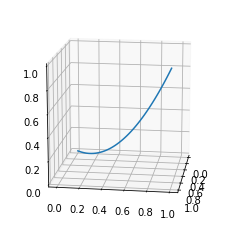

In [ ]:
fig = plt.figure(figsize=(4,4))
ax = fig.add_subplot(111, projection='3d')

x = np.linspace(0,1,50)
y = np.linspace(0,1,50)
z = x*y

ax.plot(x,y,z)
ax.view_init(15, 8)

**Comment:**<br>
This non-linear relationship might be reasonable to us, but we have no way of knowing how it influences the RL model on a technical level without running intensive comparative studies. Nevertheless, due to the sheer volume of tweets, the model might be able to compensate for individual non-linearity by the shape of function approximation learned for different volumes of tweets, which is our working assumption behind choosing this method over grouped averages.

# Bitcoin news headlines

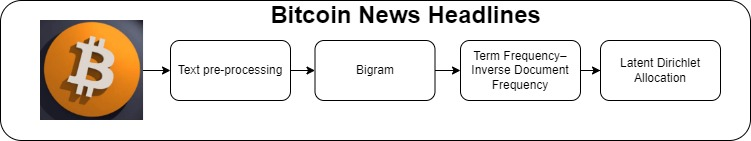

The Third dataset that we will implementing into the model has been created for analyzing crypto currency headlines.  The data set was obtained from https://bdc.consulting/insights/cryptocurrency/analyzing-crypto-headlinesonline containing with 2 columns `publishdate` and `headlinetext` with 223084 entries. 


In [ ]:
#Dataset from https://bdc.consulting/insights/cryptocurrency/analyzing-crypto-headlines
df = pd.read_csv('crypto_news.csv')

In [ ]:
df

,publishdate,headlinetext
0,20170707,what is apx
1,20171016,what is not
2,20171116,what is ark
3,20171125,what is eos
4,20180115,what is nxt
...,...,...
223079,20190721,qompass announces airdrop ahead of their ico p...
223080,20190308,confideal mvp 13 cooperations with other compa...
223081,20190226,pr secure identity ledger corporation goes dir...
223082,20190722,mymedis readies for ico launch creates a new p...


In [ ]:
df.dtypes

publishdate      int64
headlinetext    object
dtype: object

In [ ]:
# drops nan date entries
df = df.dropna() 

# drops duplicate headlines
df = df.drop_duplicates(subset=['headlinetext'], keep= False) 

# convert dates to datetime and order
df["Date"] = df["publishdate"].apply(str)
df = df.set_index(pd.to_datetime(df['Date'].str.strip(), format='%Y%m%d'))

In [ ]:
df

,publishdate,headlinetext,Date
Date,,,
2017-07-07,20170707,what is apx,20170707
2017-10-16,20171016,what is not,20171016
2017-11-16,20171116,what is ark,20171116
2017-11-25,20171125,what is eos,20171125
2018-01-15,20180115,what is nxt,20180115
...,...,...,...
2019-07-21,20190721,qompass announces airdrop ahead of their ico p...,20190721
2019-03-08,20190308,confideal mvp 13 cooperations with other compa...,20190308
2019-02-26,20190226,pr secure identity ledger corporation goes dir...,20190226


## Text processing


Text-preprocessing we have implemented the following functions:

Using the NLTK library

- Remove punctuation
Using Python string functions and NLTK

- Make tweet lowercase
Using Python string functions and NLTK

- Remove stopwords
Using Python string functions and NLTK

- Stemming / Lemmatizing
Using Python string functions and NLTK / WordNet

This following list of words **(bitcoin, bitcoins, btc, crypto, blockchain)**, are added to the to the list of stop words as they are the most common words shown in the exploration of the dataset, which was done for us at https://bdc.consulting/insights/cryptocurrency/analyzing-crypto-headlinesonline

These words will appear in so many of the documents, that they don't add any discriminatory value for our model.

In [ ]:
!pip install pyLDAvis

     |████████████████████████████████| 1.7 MB 5.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=05a5aff9bb75aa33d0fb6104e9fb5e47a226183bd25b140465e964084b817360
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
Successfully built pyLDAvis


In [ ]:
#Text Processing imports
from sklearn.feature_extraction import _stop_words
Stop_Words= _stop_words.ENGLISH_STOP_WORDS
import string
import nltk
nltk.download('wordnet')
nltk.download('punkt')
from nltk.stem import WordNetLemmatizer
from nltk import word_tokenize
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
#LDA imports
import gensim
import gensim.corpora as corpora
from gensim.models.ldamodel import LdaModel
from gensim.models import TfidfModel

import pyLDAvis
import pyLDAvis.gensim_models

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


In [ ]:
bitcoin = frozenset(['bitcoin', 'bitcoins','btc','crypto','blockchain'])

In [ ]:
def text_processing(text):
    # remove punctuation 
    text = "".join([c for c in text 
                    if c not in string.punctuation])
    # lowercase
    text = "".join([c.lower() for c in text])
    # remove stopwords
    text = " ".join([w for w in text.split() 
                     if w not in Stop_Words.union(bitcoin)])
    # stemming / lematizing (optional)
    text = " ".join([lemmatizer.lemmatize(w) for w in text.split()])
    return text

In [ ]:
df = df.loc[(df.index>start)&(df.index<end)]
df['Headline_clean'] = df['headlinetext'].apply(text_processing)
df

,publishdate,headlinetext,Date,Headline_clean
Date,,,,
2017-07-07,20170707,what is apx,20170707,apx
2017-10-16,20171016,what is not,20171016,
2017-11-16,20171116,what is ark,20171116,ark
2017-11-25,20171125,what is eos,20171125,eos
2018-01-15,20180115,what is nxt,20180115,nxt
...,...,...,...,...
2019-07-21,20190721,qompass announces airdrop ahead of their ico p...,20190721,qompass announces airdrop ahead ico presale se...
2019-03-08,20190308,confideal mvp 13 cooperations with other compa...,20190308,confideal mvp 13 cooperation company 12 extern...
2019-02-26,20190226,pr secure identity ledger corporation goes dir...,20190226,pr secure identity ledger corporation go direc...


In [ ]:
# tokenize
docs = df['Headline_clean'].values
doc_words = [word_tokenize(d) for d in docs]

Bigrams are used in most successful language models for speech recognition, they are two words frequently occurring together in the document. <br>
Using bigrams we can get phrases like “wall_street” in our output without bigrams we would only get “wall” and “street.

In [ ]:
#bigram model
bigram = gensim.models.Phrases(doc_words, min_count=5, threshold=100) # higher threshold fewer phrases.
bigram_mod = gensim.models.phrases.Phraser(bigram)
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

doc_words_bigrams = make_bigrams(doc_words)

## LDA

Creating a dictionary containing all words from the headlines 

In [ ]:
# Create Dictionary
dictionary = corpora.Dictionary(doc_words_bigrams)
print(dictionary)
corpus = [dictionary.doc2bow(d) for d in doc_words_bigrams]

Dictionary(51299 unique tokens: ['apx', 'ark', 'eos', 'nxt', 'neo']...)


We use Tfidf vectorizer as we want to weight the terms by their inverse frequency. This is to make "irregular" headlines count for more, as we believe that headlines are less generalizable than something like social media posts - it is highly likely (or should be) that new information will be presented in a news headline.

In [ ]:
model = TfidfModel(corpus)  # fit Tfidf model
tfidf = model[corpus]  # transform the corpus into tfidf

We create an LDA model with 20 topics

In [ ]:
lda_model_path = "./news_lda_model/news_lda_trained.model"

# Set training parameters.
num_topics = 20
chunksize = 10000
passes = 2
iterations = 100
eval_every = None  # Don't evaluate model perplexity, takes too much time.

# Make a index to word dictionary.
temp = dictionary[0]  # This is only to "load" the dictionary.
id2word = dictionary.id2token

%time lda = LdaModel(corpus=corpus, id2word=id2word, chunksize=chunksize, \
                        alpha='auto', eta='auto', \
                        iterations=iterations, num_topics=num_topics, \
                        passes=passes, eval_every=eval_every)
try:
  os.mkdir("news_lda_model")
except OSError as error:
  print(error)
lda.save(lda_model_path)

CPU times: user 1min 25s, sys: 966 ms, total: 1min 26s
Wall time: 1min 42s
[Errno 17] File exists: 'news_lda_model'


/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:496: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)
/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:496: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)
/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:496: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)


## View Topics

Now we would like to get a feeling for the contents of the found topics. We can start by looking at the top words

In [ ]:
# Print the Keyword in the topics
pprint(lda.print_topics())
doc_lda = lda[tfidf]

[(0,
  '0.076*"cryptoslate" + 0.041*"security" + 0.011*"provider" + '
  '0.011*"exchange" + 0.011*"kraken" + 0.010*"upgrade" + 0.010*"token" + '
  '0.010*"gaming" + 0.009*"korean" + 0.008*"wall_street"'),
 (1,
  '0.087*"price" + 0.053*"xrp" + 0.048*"ethereum" + 0.039*"ripple" + '
  '0.026*"market" + 0.021*"eth" + 0.015*"2019" + 0.015*"hit" + 0.013*"high" + '
  '0.013*"bull"'),
 (2,
  '0.023*"startup" + 0.022*"research" + 0.021*"firm" + 0.018*"solution" + '
  '0.017*"help" + 0.014*"capital" + 0.014*"internet" + 0.012*"platform" + '
  '0.012*"private" + 0.011*"public"'),
 (3,
  '0.058*"launch" + 0.035*"new" + 0.031*"mining" + 0.026*"news" + '
  '0.019*"cryptocurrency" + 0.019*"reveals" + 0.017*"partnership" + '
  '0.016*"platform" + 0.014*"app" + 0.013*"pr"'),
 (4,
  '0.063*"cash" + 0.029*"bch" + 0.020*"account" + 0.019*"news" + 0.018*"user" '
  '+ 0.016*"twitter" + 0.016*"official" + 0.016*"craig_wright" + '
  '0.014*"thailand" + 0.014*"lightning_network"'),
 (5,
  '0.056*"digital" + 0.

We can see that different words constitute the top words in the different topics. But it is hard to get a feeling for how they are distinct from one another.

A very nice library for visualizing LDA topics, is the pyLDAvis library, which can create a very nice interactive graph of our LDA topics.

In [ ]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda, corpus, dictionary)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
1     -0.320716  0.020173       1        1  8.380543
9     -0.051796 -0.160745       2        1  6.262064
3      0.102004 -0.179737       3        1  6.192318
6      0.089989  0.191238       4        1  5.520713
5      0.134274  0.063575       5        1  5.451634
18    -0.167012  0.021014       6        1  5.443282
19    -0.015979 -0.175835       7        1  5.302980
13     0.072185  0.038972       8        1  5.212632
10     0.030844 -0.137823       9        1  5.075035
17     0.063997  0.193628      10        1  4.929835
8      0.117023 -0.018080      11        1  4.754809
2      0.122211 -0.077203      12        1  4.582548
15     0.056764  0.016887      13        1  4.412234
12     0.067436  0.052222      14        1  4.241580
14    -0.303381  0.017179      15        1  4.227027
4     -0.007030 -0.065823      16        1  4.161588
11     0.057178 -0.100396      17        1  4.108204
7     -0.069501  0.028559      18        1  4.062966
16    -0.010687  0.203833      19        1  4.054712
0      0.032197  0.068362      20        1  3.623298, topic_info=              Term          Freq         Total Category  logprob  loglift
290          price  10199.000000  10199.000000  Default  30.0000  30.0000
5234    beincrypto   6188.000000   6188.000000  Default  29.0000  29.0000
306         market   8167.000000   8167.000000  Default  28.0000  28.0000
395           bank   6198.000000   6198.000000  Default  27.0000  27.0000
201       exchange   9016.000000   9016.000000  Default  26.0000  26.0000
...            ...           ...           ...      ...      ...      ...
201       exchange    446.916211   9016.993274  Topic20  -4.5091   0.3133
4017        belief    213.658288    361.615101  Topic20  -5.2471   2.7916
2795  criptomoedas    239.147947   1330.138796  Topic20  -5.1344   1.6018
210             da    220.125784    686.819536  Topic20  -5.2173   2.1799
1273           say    211.390768   6852.286915  Topic20  -5.2578  -0.1608

[1216 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
200       1  0.002764      1
200       2  0.158253      1
200       3  0.001382      1
200       5  0.001382      1
200       6  0.826512      1
...     ...       ...    ...
31        5  0.089710  zcash
31       13  0.002803  zcash
31       18  0.905512  zcash
1851      6  0.993239  zcoin
8589      1  0.993500   zone

[3088 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 10, 4, 7, 6, 19, 20, 14, 11, 18, 9, 3, 16, 13, 15, 5, 12, 8, 17, 1])

Topic Modelling is used to extract topics from a collection of documents. The topics are essentially a cluster of words which create a subject matter. This help in the understanding of hidden semantic structure between words in a large number of text in this case the headlines at an aggregate level

#### Topic Bubble:

- The bubbles represent the different topics.

- The larger the bubble, the more frequent the topic is in the corpus.

- Distance between the topics is an approximation of semantic relationship between the topics. We see that it plotted on the axes of principal components 1 and 2. Principal component analysis is a dimensionality reduction technique which is designed to maximize the variance between datapoints. Hence The topic which shares common words will be overlapping. Take a look at The top 30 words for Topic 1 and Topic 15 notice they have many in comman

#### Horizontal Bar Graph:

- The bar graph shows the frequency distribution of the words in the documents (color: blue).

- The red shaded area describes the frequency of each word given a topic.

- Hovering over the specific words (in the right panel), Will display only topics containing that word. The size of the bubble in this scenario indicates the weight of the selected word in that topic. Higher the weight results in a larger bubble.

- Rank words in topics based on their frequency: by varying λ lambda parameter.
Decreasing the lambda parameter, increase the weight of the ratio of the frequency of word given the topic / Overall frequency of the word in the corpus. Important words for the given topic moves upward. Placing more weight on TF as opposed to TFIDF

#### PC1:
It seems that there is a trend in PC1 where a negative value corresponds to startups, altcoins and new ventures in cryptocurrency, and positive values are constituted of mentions of established institutions. Perhaps it could be explained as grassroots vs mainstream adoption?

#### PC2:
It seems that positive values of PC2 corresponds, roughly speaking, to buying/investing in crypto currencies from established institutions whereas negative values seems to correspond to selling or trading coins in the marketplace.

Very interesting results!

In [ ]:
path = 'lda_btcnews.html'
pyLDAvis.save_html(vis, path)

In [ ]:
import wordcloud

In [ ]:
class SimpleGroupedColorFunc(object):
    """Create a color function object which assigns EXACT colors
       to certain words based on the color to words mapping

       Parameters
       ----------
       color_to_words : dict(str -> list(str))
         A dictionary that maps a color to the list of words.

       default_color : str
         Color that will be assigned to a word that's not a member
         of any value from color_to_words.
    """

    def __init__(self, color_to_words, default_color):
        self.word_to_color = {word: color
                              for (color, words) in color_to_words.items()
                              for word in words}

        self.default_color = default_color

    def __call__(self, word, **kwargs):
        return self.word_to_color.get(word, self.default_color)

In [ ]:
def viz_topic(topic, title, color_func):
    fig_wordcloud = wordcloud.WordCloud(
        max_font_size=100, max_words=50, background_color="white", prefer_horizontal=1, relative_scaling=0.8,
    ).fit_words(topic)
    if color_func is not None:
        fig_wordcloud.recolor(color_func=color_func)
    plt.figure(figsize=(10,7), frameon=True)
    plt.imshow(fig_wordcloud, interpolation="bilinear")  
    plt.axis('off')
    plt.title(title, fontsize=20)
    plt.show()

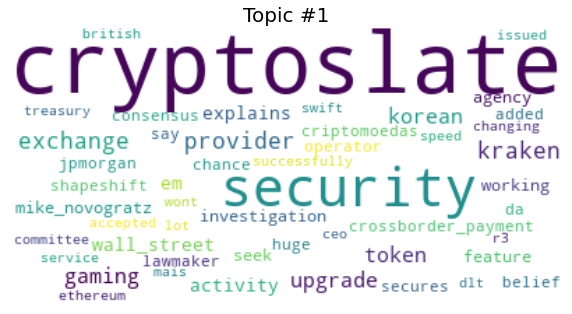

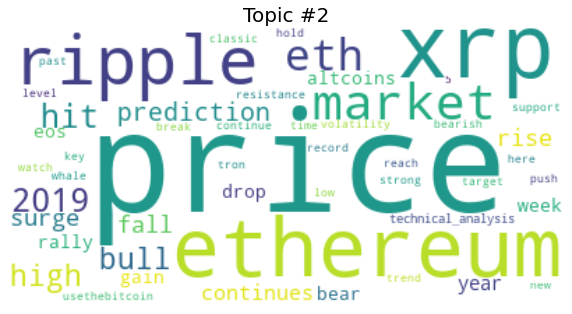

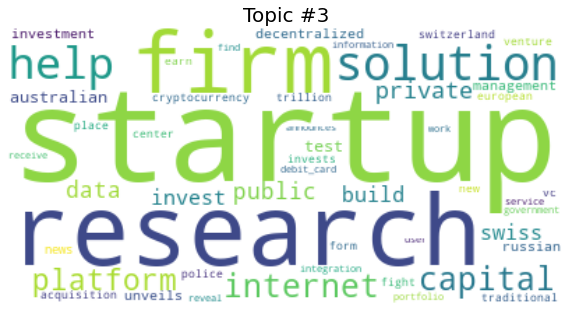

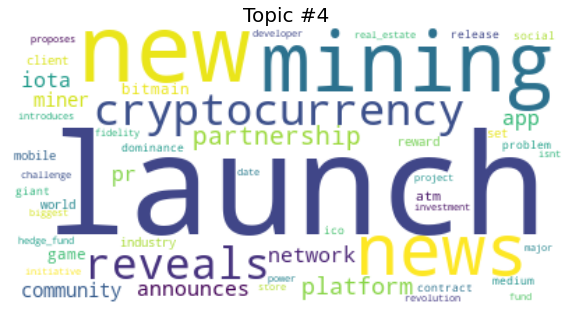

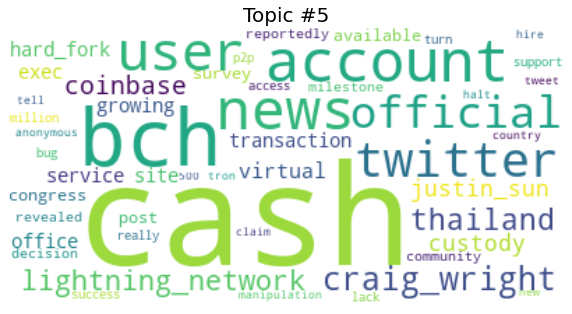

...

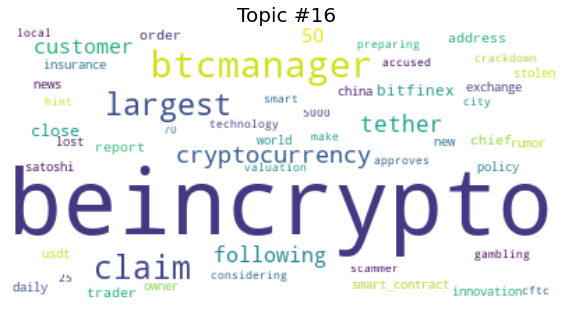

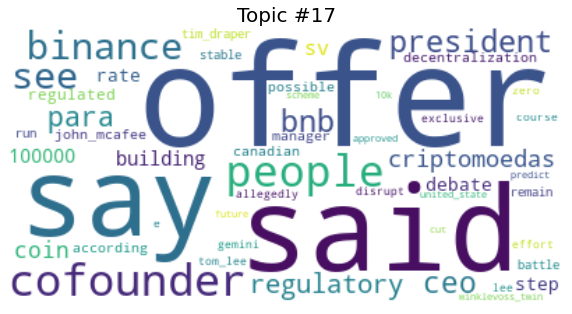

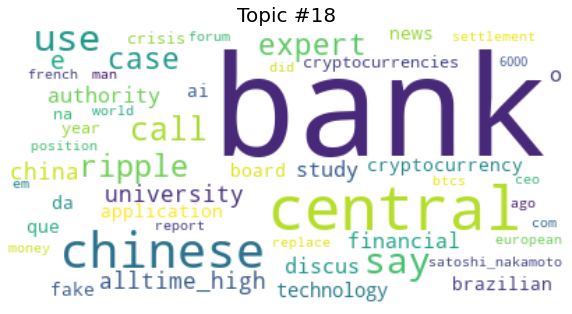

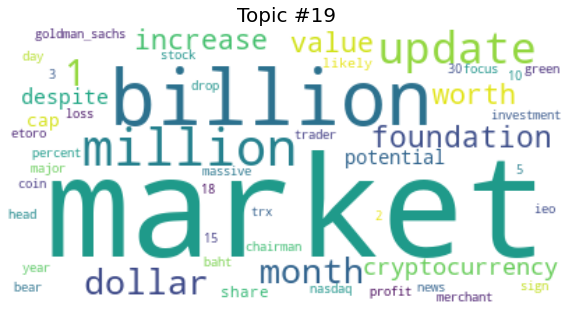

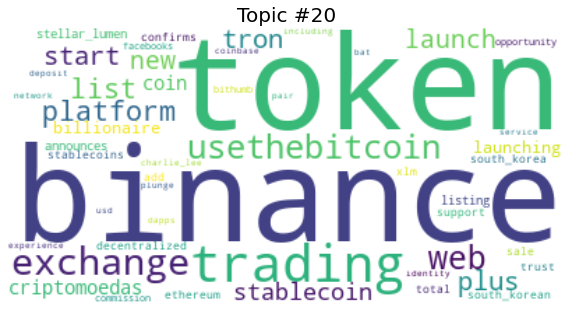

In [ ]:
for i in range(20):
    viz_topic(dict(lda.show_topic(i, topn=50)), "Topic #{}".format(i+1), None)

## Adding predictions

The headlines are grouped by Date and their respective topic weights are summed together, reulting in each date day having 20 topics and weight as is seen in the below Dataframe 'df'. This has been done as generally news or headllines in this case follow the same sentiment with nuonce, mainly due to the agenda of the company distriubuting the news but the bottom line remains the same. Therefore, for the purpose of getting the total topic weights for each day. 

In [ ]:
from scipy.sparse import csr_matrix, vstack

predictions = []
for prediction in doc_lda:
    topics = list(list(zip(*prediction))[0])
    probabilities = list(list(zip(*prediction))[1])
    prediction = csr_matrix([probabilities[topics.index(i)] if i in topics else 0 for i in range(20)])
    predictions.append(prediction)

predictions = vstack(predictions)
df = pd.DataFrame.sparse.from_spmatrix(predictions, index=df.index,columns=["news topic #{}".format(i+1) for i in range(20)])
df = df.groupby(df.index).sum()


In [ ]:
df

,news topic #1,news topic #2,news topic #3,news topic #4,news topic #5,news topic #6,news topic #7,news topic #8,news topic #9,news topic #10,news topic #11,news topic #12,news topic #13,news topic #14,news topic #15,news topic #16,news topic #17,news topic #18,news topic #19,news topic #20
Date,,,,,,,,,,,,,,,,,,,,
2016-01-02,0.199139,0.685070,0.293164,0.702101,0.222844,0.260942,0.427850,1.423578,0.369595,0.258619,0.331708,0.464531,0.577129,0.324198,0.761855,0.758249,0.590442,0.786759,0.666434,0.895793
2016-01-03,0.247772,0.936144,0.477299,0.732674,0.579015,0.672133,0.397371,0.934371,0.832135,1.017661,0.752257,0.652998,0.451779,0.649603,0.727807,0.815777,0.635702,0.713799,0.919396,0.854305
2016-01-04,0.773834,1.817694,1.362298,2.243258,0.798086,1.105851,0.756921,1.512506,1.463787,0.599787,1.027321,0.909641,1.408466,0.909120,1.338271,1.604913,0.495810,0.560821,1.386449,0.925164
2016-01-05,0.681992,2.040667,2.137513,2.808634,2.181797,2.719834,1.384890,0.590784,1.291546,1.257702,1.691313,2.026657,1.184946,1.415915,1.541895,1.240023,2.053052,1.608617,1.502521,1.639701
2016-01-06,0.566607,0.915230,1.291367,0.692869,1.694337,1.550347,0.654923,0.953241,0.704555,0.633689,0.694369,0.787279,1.584581,1.877761,1.741527,0.804691,1.086167,0.897283,1.672117,1.197059
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-18,6.180108,14.091833,7.307925,9.712263,6.970153,9.020483,7.979761,8.298966,7.446092,8.704368,8.661788,7.730031,5.981349,8.167307,7.693782,7.918919,6.521386,8.051538,7.339221,7.222728
2019-11-19,7.043729,16.432102,9.035586,9.387838,7.301739,8.006961,10.453423,10.281244,7.500381,8.172510,9.597482,7.825233,8.262850,8.604679,7.023908,9.076277,8.622227,7.952922,10.914661,8.504246
2019-11-20,6.321655,16.035345,8.742908,9.427837,7.018782,10.873623,8.883875,8.045732,8.879591,9.826265,8.254338,8.095063,7.985618,7.459486,8.487484,9.054922,7.490294,9.052071,9.656508,7.408598


In [ ]:
#Save results
path = "crypto_news_lda_topics.csv"
df.to_csv(path)

# Reinforcement Learning


## PPO2 Algorithm

Taking inspiration of the Adam King's Bitcoin RL trader (https://github.com/kwhkim/Bitcoin-Trader-RL?fbclid=IwAR0Bm1h3n6sMV5DAa9j5QIUSVGe8e1Sxz93kcgXs8iPAyNIQbYXkzUp6KrA), we actually implemeted an RL algorithm that can trade **a portoflio consisting of gold and bitcoin**. We’ve chosen to use the Proximal Policy Optimization algorithm which is a new family of gradient methods for reinforcement learning which alternate between sampling data through interaction with the environment and optimizing a "surrogate" objective function using stochastic gradient ascent. The specific algorithm enables for multiple epochs of minibatch trainings. More specifically, we used the PPO2 from the stable-baselines (https://stable-baselines.readthedocs.io/en/master/modules/ppo2.html).

We approximate our policy by using an LSTM neural network  which is used a lot in time series analysis and forecasting since it has the ability to maintain internal state over time and uses the output of the previous time step.

## Reinforcement  Learning Environment
The RL environment for trading is implemented in the file **TradingEnvironment___.py** . In each time step the agent observes the current financial indicators of the Bitcoin and the gold as well as the results of the sensitivity analysis for the specific day that came from the twitter and the news headlines dataset. We have also implemented two simple SARIMAX models for  doing predicting for the next ten time- steps. Therefore, in each time step the agent forecasts the prices of the bitcoin and the gold for the next 10 days and then uses these values with their corresponding confidence intervals together with the other variables of the observation space to take some action.

The action space consists of 18 discrete actions. We consider that each action is a transition to a new portfolio composition. Our portfolio consists of some money that the agent has in the trading platform, some amount of bitcoin and some gold.
We initialize the environment by setting our initial money to 10,000 USD and the amount of bitcoin and gold that we hold to zero. In the next time step the agent will take an action that will change the portfolio composition.
Let’s consider an example to demonstrate what the actions of our agent mean. We consider the case in which the portfolio composition is the following:


*   33% in Gold, 33% in Bitcoins and the rest 33% is our cash balance.

Then the agent takes an action and goes to the following portfolio weights are:

*   25% in Gold, 50% in Bitcoins and 25% in Cash.

This means that our agent sold 33%-25%=8% of the total portfolio worth, bought 50%-33%=17% of  it and the cash dropped by 33%-25%=8%.
To simplify the process, we used the following fixed potential portfolio distributions:

Bitcoin |Gold
--- | ---
1 | 0
0 | 1
0 | 0
0 | 0.25
0 | 0.33
0 | 0.5
0.25 | 0
0.25 | 0.25
0.25 | 0.33
0.25 | 0.5
0.33 | 0
0.33 | 0.25
0.33 | 0.33
0.33 | 0.5
0.5 | 0
0.5 | 0.25
0.5 | 0.33
0.5 | 0.5

For every row of the above table the weight of the cash can be computed as:


$$ weight_{cash}=1-(weight_{bitcoin}+weight_{gold}) $$

##Rewards

The aim of the reward function is to not only reward profits from holding BTC while it is increasing in price, but also reward profits from not holding BTC while it is decreasing in price.

**Sortino**

In order to understand the Sortino ratio we need to briefly explain its origin. Sortino is updated version of Sharpe ratio which is used to help investors understand the return of an investment compared to its risk.
The ratio is the average return earned more than the risk-free rate per unit of volatility or total risk. Volatility is a measure of the price fluctuations of an asset or portfolio.

The Sortino ratio considers downside volatility as risk, rather than overall volatility. As a result, this ratio does not penalize upside volatility. The formula looks like this:

$$ Sortino=\frac{Portfolio \, Returns-Benchmark \,Returns}{Standard \, deviation \,of \,downside} $$

Finally, in the following figure we can see the imputs that we pasre into the RL agent:

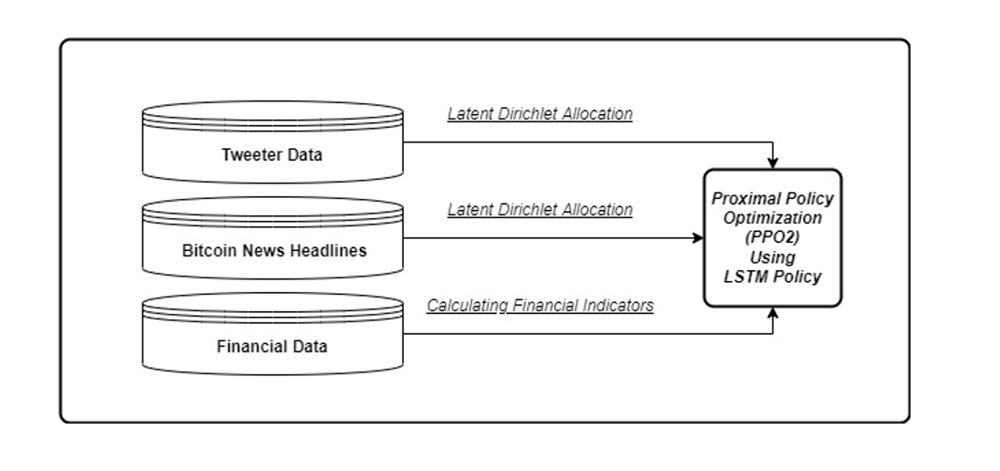










In [ ]:
import importlib
%matplotlib inline
import pickle

In [ ]:
import ABA.Environments.Render.Render_Graph
import ABA.Environments.TradingEnvironment___
importlib.reload(ABA.Environments.Render.Render_Graph)
importlib.reload(ABA.Environments.TradingEnvironment___)
from ABA.Environments.Render.Render_Graph import BitcoinTradingGraph
from ABA.Environments.TradingEnvironment___ import TradingEnvironment

In [ ]:
#Join all data
path1 = "volumetric_topicsentiment_final.csv"
path2 = "financial_indicators.csv"
path3 = "crypto_news_lda_topics.csv"

data = pd.read_csv(path1)
data = data.set_index("Date")
data.index = pd.to_datetime(data.index)

data2 = pd.read_csv(path2)
data2 = data2.set_index("Date")
data2.index = pd.to_datetime(data2.index)

df = pd.read_csv(path3)
df = df.reindex(data.index) #must wrangle bitcoin_news because of missing dates
df = df.fillna(0)
df = df.set_index('Date')
df.index = pd.to_datetime(df.index)  

data = data.join(data2,how='left')
data = data.join(df,how='left')

path = "final_df_all.csv"
data.to_csv(path)

#### Model Training
Now we are to train some models!
We join the four datasets into one, in order use in our Reinforcement Learning Model (RL) . We split the dataset into two parts (80%-20% ) and we use the first for training the agent for 40 epochs.  
In the test we can check the performance of our agent. In order to have easier to observe results we created a render function that 


In [ ]:
#Split dataset into train and test set (test 20% of the original dataset)
test_length = int(len(data) * 0.2)
train_length = int(len(data)) - test_length

train_data = data[:train_length]
test_data=data[train_length:]

# Creating two environments, one for the training and one for the test dataset 
train_env = DummyVecEnv([lambda: TradingEnvironment(data=train_data, initial_balance=10000, commission=0.0025, reward_function='sortino', forecast_length=10, confidence_interval=0.95)])
test_env = DummyVecEnv([lambda: TradingEnvironment(data=test_data, initial_balance=10000, commission=0.0025, reward_function='sortino', forecast_length=10, confidence_interval=0.95)])

path = './ppo2_agents/agents_PPO2_'

In [ ]:
#If you wish to save models to drive
#from google.colab import drive
#drive.mount('/content/drive')
#path = './drive/MyDrive/ppo2/agents_PPΟ2_'

Mounted at /content/drive


In [ ]:
import random
import pickle

random.seed(0)

#change to last training iteration if you wish to resume training from last iteration
#otherwise set to -1
#curr_idx = -1 
reward_strategy = 'sortino'

if curr_idx == -1:
  model = PPO2(MlpLnLstmPolicy, train_env, verbose=0, nminibatches=1, tensorboard_log="./tensorboard")
else:
  model = PPO2.load(path + reward_strategy + '_' + str(curr_idx) + '.pkl', env=train_env)

rewards = []
net_worth = []
action_log = []
state_log = []

for idx in range(curr_idx + 1, 40):
    print('[', idx, '] Training for: ', train_length, ' time steps')

    model.learn(total_timesteps=train_length)

    obs = test_env.reset()
    done, reward_sum = False, 0

    net_worth.append([])
    state_log.append([])
    action_log.append([])
    while not done:
        action, _states = model.predict(obs)
        obs, reward, done, info  = test_env.step(action)
        if not done:
          net_worth[idx].append(test_env.env_method("return_net_worth")[0])
          state_log[idx].append(np.array(obs[0][0]))
          action_log[idx].append(action)
        reward_sum += reward
    net_worth[idx] = net_worth[idx][-1]
    rewards.append(reward_sum)
    print('[', idx, '] Total reward: ', reward_sum, ' (' + reward_strategy + ')', ' Final networth: ', net_worth[idx][-1])
    model.save(path + reward_strategy + '_' + str(idx) + '.pkl')
    with open(path + reward_strategy + '_' + str(idx) + "networths", "wb") as f:
      pickle.dump(net_worth[idx],f)
    with open(path + reward_strategy + '_' + str(idx) + "statelog", "wb") as f:
      pickle.dump(state_log[idx],f)
    with open(path + reward_strategy + '_' + str(idx) + "actionlog", "wb") as f:
      pickle.dump(action_log[idx],f)

[ 0 ] Training for:  1431  time steps

[ 0 ] Total reward:  [9910.647]  (sortino)  Final networth:  7986.387779704504
[ 1 ] Training for:  1431  time steps

[ 1 ] Total reward:  [11597.869]  (sortino)  Final networth:  7991.5168050851225
[ 2 ] Training for:  1431  time steps
[ 2 ] Total reward:  [5285.361]  (sortino)  Final networth:  7688.286990498051
[ 3 ] Training for:  1431  time steps
[ 3 ] Total reward:  [19294.316]  (sortino)  Final networth:  7385.164630396557
[ 4 ] Training for:  1431  time steps
[ 4 ] Total reward:  [13886.755]  (sortino)  Final networth:  9420.300721347172
[ 5 ] Training for:  1431  time steps
[ 5 ] Total reward:  [23622.87]  (sortino)  Final networth:  9160.110222896648
[ 6 ] Training for:  1431  time steps
[ 6 ] Total reward:  [8084.3276]  (sortino)  Final networth:  9544.939606571843
[ 7 ] Training for:  1431  time steps
[ 7 ] Total reward:  [16328.738]  (sortino)  Final networth:  7234.165904129501
[ 8 ] Training for:  1431  time steps
[ 8 ] Total reward

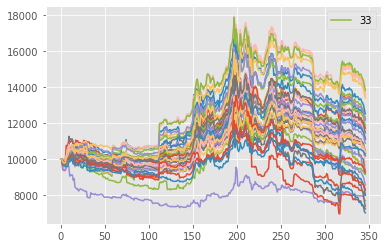

<Figure size 432x288 with 0 Axes>

In [ ]:
#all agents
best_idx = np.argmax([i[-1] for i in net_worth])
for idx,i in enumerate(net_worth):
  if idx == best_idx:
    plt.plot(i, label=idx)
  else:
    plt.plot(i)
plt.legend()
plt.show()
plt.savefig("Net_worths.png")

**Comment:**<br>
In the above figure we can observe the evolution of the portfolio value of the  40 trained agents in the test set. The net worth of  most of the agents seems to increase and in the end we have a profit for most of the agents, albeit not all of them!

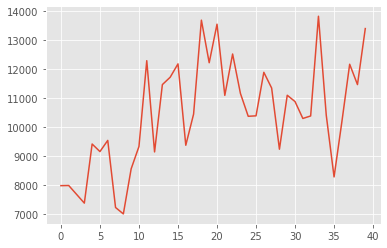

In [ ]:
final_networths = [i[-1] for i in net_worth]
plt.plot(final_networths)

**Comment:**<br>
In the above figure the final portfolio values of the 40 agents can be seen. Most of the agents finish a trading session with a profit. And, despite large variation, there seems to be a trend where final net worth is increasing with sequential training iterations.

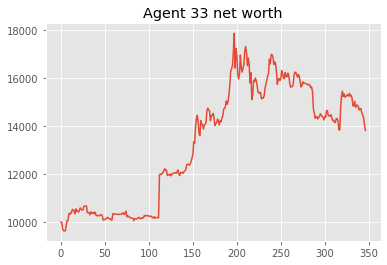

In [ ]:
#best agent
plt.plot(net_worth[best_idx])
plt.show
plt.title("Agent {} net worth".format(best_idx))
plt.savefig("net_worth_best.jpg")

**Comment:**<br>
In the above figure the final portfolio values alteration for the most profitable agent can be easily observed overtime. We can see that after the 150th time-step the portfolio value does not drop below 14000 USD. 

## Rendering RL


Our render function consists of 3 graphs. 
The upper section demonstrates the flow of our total net worth in comparison with a benchmarked trading strategy (buys and hold) in which we essentially spent 50% of our initial capital  in bitcoins and another 50% in gold and we keep this portofolio stable observing its losses and gains overtime.

The middle section shows the variation of the prices for both Gold (**color magenta**) and Bitcoin (**color black**) while makes clear to viewer the exact time that our agent buys or sells certain amount of each unit. Each time a red triangle appears on a line our agent sells some amount of the respective units. If the triangle is green, our agent buys.
Last but not least, the bottom section of the graph presents the volume alteration that happens overtime to the units of interest. 

It is remarkable that these agents were given no prior  financial or trading knowledge, and instead learned to take (sometimes :P) profitable actions through trial and error alone. 


In [ ]:
curr_idx = 39

KeyboardInterrupt: ignored

<Figure size 432x288 with 0 Axes>

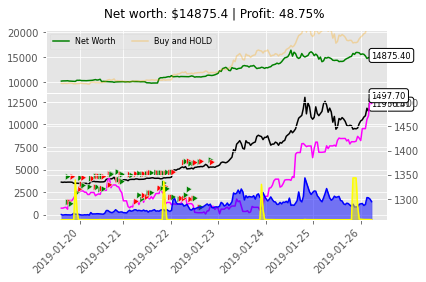

In [ ]:
model = PPO2.load(path + reward_strategy + '_' + str(curr_idx) + '.pkl', env=train_env)

obs, done = test_env.reset(), False

while not done:
  action, _states = model.predict(obs)
  obs, reward, done, info = test_env.step(action)
  test_env.render(mode="human");


**Comment:**<br>
The live graph shows how the net worth of our portoflio (green line) changes in each time step in which our agent interacts with the environment and takes actions. These actions can be easily observed on the price lines of both gold (magenta) and bitcoin (black). The red triangles declare sell actions while the green ones declare buy actions. In the bottom of the graph we can see with blue the bitcoin volume and with yellow the gold volume. Some interesting results can be drawn by observing the graph.
*   The net worth seemms to increase over time while it ensures smooth changes in the portofolio value (risk-averse agent). Sometimes the gains seem to be less than the the corresponding gains of the benchmark strategy but on the other hand whem the agent loses, the losses are smaller than the buy-and-hold benchmark strategy.
*   Also, when the prices of bitcoin and gold start to rise sharply, the agent seems to perform hold actions in order to ensure that the portfolio value is higher. This feature may be a result of the predictions of the prices that the agent takes into consideration in each time step.





# SHAP

Now, we will try to see if we can gain any insights into the inner workings of the Reinforcement Learning Agent by calculating Shapley values for the model. There currently exists no native SHAP support for the PPO2 algorithm, but with the KernelExplainer class, you may pass any function together with any valid data-input, and a specially weighted linear regression model will approximate the model and return Shap values for the model. This makes it easy to code an implementation for the PPO2 model, as this model natively has a method that will return probabilities of the action-space, given a valid observation-state. The code-blocks below implements this function in the desirable format for the Shap explainer object, and computes Shap values for the first 50 states in our test environment. Note that computing one Shap value took us approximately 358 seconds. So, for your convenience, we have saved and packaged the Shap values together with this notebook, such that you may skip this section which computes the Shap values, and go straight to the Shap plots.

In [ ]:
import shap

In [ ]:
def action_probability_all(data):
  predictions = []
  for x in data:
    prediction = model.action_probability([[x]])
    predictions.append(np.array(prediction)[0])
  return np.array(predictions)

In [ ]:
model = PPO2.load(path_model + reward_strategy + '_' + str(curr_idx) + '.pkl', env=test_env)

train_action_log = []
train_state_log = []

obs, done = train_env.reset(), False
while not done:
  action, _states = model.predict(obs)
  obs, reward, done, info = train_env.step(action)
  if not done:
    train_action_log.append(action)
    train_state_log.append(np.array(obs[0][0]))

path = reward_strategy + '_' + str(curr_idx) + "trainstatelog"
with open(path, "wb") as f:
  pickle.dump(train_state_log, f)






Instructions for updating:
Use keras.layers.flatten instead.
Instructions for updating:
Please use `layer.__call__` method instead.





Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where





In [ ]:
path = path_model + reward_strategy + '_' + str(curr_idx) + "statelog"
with open(path,"rb") as f:
  state_log = pickle.load(f)

explainer = shap.KernelExplainer(action_probability_all, shap.sample(np.array(train_state_log),100))
shap_values = explainer.shap_values(np.array(state_log[:50]))

with open("./drive/MyDrive/shap2","wb") as f:
  pickle.dump(shap_values,f)

  0%|          | 0/50 [00:00<?, ?it/s]

FileNotFoundError: ignored

## SHAP plots


The first plot we can draw, is a summary plot, to see the top features of the model, and their influence


In [ ]:
action_space = []
with open("action_space_2.txt") as f:
  for line in f.readlines():
    action_space.append(line.rstrip())

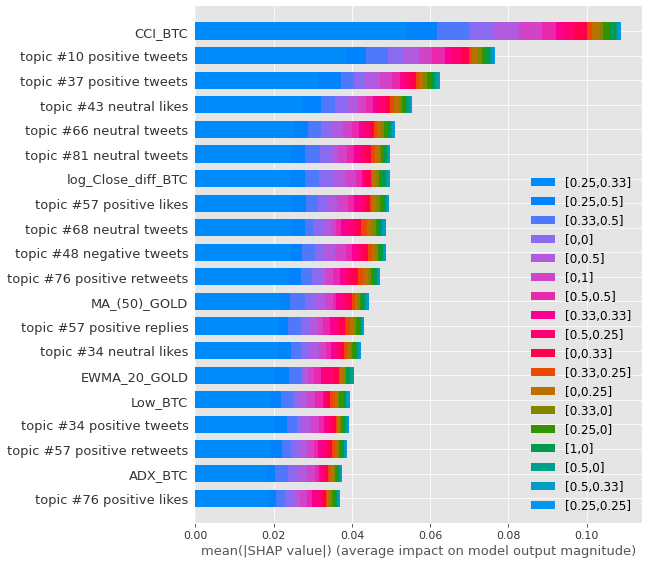

In [ ]:
shap.summary_plot(shap_values,feature_names = data.columns, class_names = action_space)

**Comment:**<br>
It seems that we have influential features both from the financial indicators and the tweets! Very interesting. It also seems that for certain topics, the amount of times tweets has been liked or replied to are more indicative for the model than the sheer volume of tweets within this topic. Let’s make an overview of the contents of the topics that has been deemed important by the Shap values.

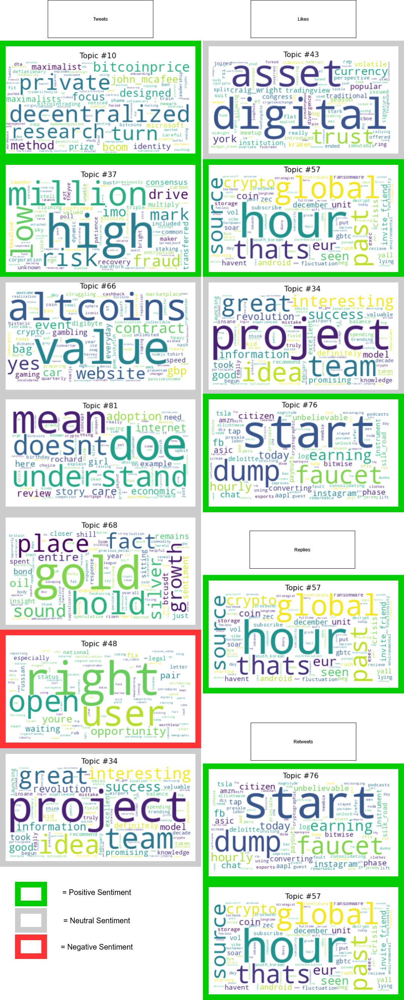

The topics above are listed from top to bottom, by importance within it’s own category (tweets, likes, replies, retweets). These results are incredibly interesting! It seems to actually make a difference to the model, whether we observe volumes of tweets, likes or replies. And the sentiments within the topics seems to actually be significant also! But why is this? There are so many questions you could ask and many a hypothesis that you could construct to try and answer them. Perhaps when few tweets from key accounts within a certain topic is driving the price, in these cases the model finds likes/replies to be most indicative of which action it should take? Why are there so many important indicators that are of positive/neutral sentiment? Perhaps the model has only experienced “good times” for Bitcoin/gold, so it has not learned to look for indicators of steep decreases. Perhaps there is always an abundance of positive Bitcoin sentiment, and a marked decrease in this volume is enough of an indicator to sell. Can we group some topics, and see more distinctive indicators?

Finally, we may also draw force-plots for individual measurements. In our case, we can draw a force plot for an individual action – what are the significant variables for taking a certain action? Let’s look at two distinct actions; putting 100% of your portfolio in Bitcoin and putting 100% of your portfolio in gold. Below we have drawn the two force plots for each of these actions.

In [ ]:
shap.initjs()
shap.plots.force(explainer.expected_value[0],shap_values[0],feature_names = data.columns, out_names = action_space[0])

**Comment:**<br>
The drop-down menu of variables to the left is ordered by estimated significance. And it is interesting to see that we have thus far not seen any indication that the model has considered news headlines to be influential in its decision-making. But from the force-plots, we may scroll down until we start to see some news headlines. And we have to scroll quite far, before we see the most influential news topic, topic #17:

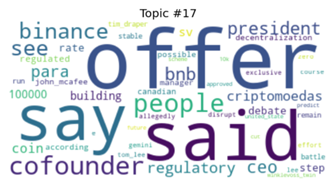

Some news headlines about offers being made from important people seem to have some, albeit minimal, effect on the model’s decision to buy bitcoins. Perhaps when main-stream figures or institutions starts to offer their products for bitcoins?

In [ ]:
shap.initjs()
shap.plots.force(explainer.expected_value[1],shap_values[1],feature_names = data.columns, out_names = action_space[1])

**Comment:**<br>
And similarly for gold above, we find topic #20 as the first in the list:

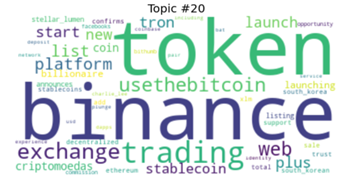

And some news headlines about tokens, launching and trading on binance seem to influence the model’s decision to buy gold. Perhaps this is related to competitive coins gaining mainstream traction?

## Validity

Trying to make sense of a model such as this one is a rather daunting task. Interesting and fun as it may be, we are often left with more questions than answers. And one of the main questions we should of course ask: how much can we trust our explanations? Any interpretations or hypothesis’ we can give should of course be considered anecdotally, and at this stage is more of a Socratic dialogue than actual insight. So the first thing we should challenge is the inference of the values themselves. We see that there are four large sources of variance in the Shap values currently:

*   The kernel method approximates the parametric function of the PPO2 algorithm. The standard function approximator from the kernel method is a weighted linear regression. We do not know if this is the most accurate function approximator for a PPO2 model.
*   When we added the training state space/observation space to the Shap explainer object, we sampled it for 100 states, to make the Shap values computationally feasible. In a time-ordered sequence of states, this may not be the optimal approach.
*   We have only computed the first 50 Shap values. To make the Shap values better represent the entirety of the model’s action-space, we should compute more.
*   There may be a large degree of collinearity in the observation space, which would mean that we cannot trust that the Shap values themselves are entirely accurate. To determine this, we would have to start removing features. The degree to which multicollinearity can affect Shap values is not entirely clear from the literature. 


# Discussion

The model as it is still has some areas where we expect that the model could be improved vastly upon. Specifically the following three major pain-points where identified:

1.   **Tuning hyperparameters of RL model (optimization study)**

A useful tool that could be implemented in order to optimizing the hyperparameters in our model is Optuna library. Optuna uses Bayesian optimization as a technique for efficiently searching a hyperspace to find the set of parameters that maximize a given objective function. It is a common method used for improving black box models.

2.   **Continous action space (Actor-critic model)**

In our model the action space was defined as discrete but for more realistic and accurate predictions we could convert it to a continous space. A tool to achieve this is actor-critic model,which is a reinforcement-learning technique in which the agent simultaneously learns a policy function and a value function.The policy function teaches agent how to make decisions, and the value function improve the training process 


3.   **Observation space may be too large.**

The observation space that we have constructed for the model is much broader than it is deep. We have ~ 1300 continous variables, and about ~1200 days in the training set. It is highly likely that the model has not been able to explore optimal policies in some combinations of the observation-space. It is also highly likely that not all of the features bears significance for determining a policy, and may instead just be drowning out the exploration efforts of the model. So, what can we do?

*   We may further process the Twitter volumetric topic sentiment data, by feeding it through a CNN architecture model, converting the variables into a prediction instead in an efficient manner
*   We could also try to sort through the features, implementing some of the methods of permutation, forward/backward passing, drop-feature importance etc.





# Conclusion

To sum up, in this project different techniques that were taught in this course were used in order to gain insights and to achieve our goal.

*   Sentiment analysis and Latent Dirichlet Analysis for topic modelling was used on Twitter data 
*   Latent Dirichlet Analysis for topic modelling was also used for the News Headlines
*   Proximal Optimization policy using LSTM was used for RL model

We observed that Twitter sentiments around certain topics was being used by the model to take decisions, while the news headlines seemed to be less indicative of which action the model should take. Also, we concluded that the agents were largely profitable! The more training iterations that we ran, the better their results were. Most of our agents were profitable on the test dataset and, although we did not beat the buy-and-hold strategy in the test dataset, it seems from rendering the model, that the downswings of the models net worth were in general less momentous than the downswings in the net worth buy-and-hold benchmark strategy. It is remarkable that our agents with no prior financial or trading knowledge, learned to take profitable actions from financial indicators and twitter data. However, we can give no guarantee that this would translate into future scenarios. We cannot say how Twitter data will evolve in the future, and we cannot say how the Bitcoin/gold price will relate to it and the financial indicators inferred from it. In short, it is simply impossible to infer about the future patterns and generalizable of such unpredictable data-patterns as Twitter and financial instruments.


